In [1]:
import celldancer.simulation as cdsim
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import random
import os
import math
import celldancer.cdplt as cdplt
import anndata as ad
from scipy.sparse import csr_matrix
import scvelo as scv
import scanpy as sc

SEED = 2024
np.random.seed(SEED)
os.chdir("/media/liyaru/LYR/Diff_change/6_cellDancer_simulation")

## simulation

In [2]:
# read parameters
para = pd.read_csv("0_simulation_parameters/simulation_parameters.csv")
para.index = para['parameters']

def Simulation_datasets(simuID):

    noise_level=float(para.loc['noise_level',simuID])  
    kinetic_type=para.loc['kinetic_type',simuID]

    num_cells = int(para.loc['num_cells',simuID])
    num_genes = int(para.loc['num_genes',simuID])
    cellnum1 = int(para.loc['cellnum1',simuID])
    cellnum2 = num_cells - cellnum1

    alpha1_min = float(para.loc['alpha1_min',simuID])
    alpha1_max = float(para.loc['alpha1_max',simuID])
    alpha2_min = float(para.loc['alpha2_min',simuID])
    alpha2_max = float(para.loc['alpha2_max',simuID])

    beta1_min = float(para.loc['beta1_min',simuID])
    beta1_max = float(para.loc['beta1_max',simuID])
    beta2_min = float(para.loc['beta2_min',simuID])
    beta2_max = float(para.loc['beta2_max',simuID])

    gamma1_min = float(para.loc['gamma1_min',simuID])
    gamma1_max = float(para.loc['gamma1_max',simuID])
    gamma2_min = float(para.loc['gamma2_min',simuID])
    gamma2_max = float(para.loc['gamma2_max',simuID])

    # sample from a uniform distribution 
    # np.random.seed(SEED)
    alpha1 = np.random.uniform(alpha1_min, alpha1_max, num_genes)
    beta1 = np.random.uniform(beta1_min, beta1_max,num_genes) 
    gamma1 =np.random.uniform(gamma1_min,gamma1_max,num_genes)

    if kinetic_type=="mono":
        alpha2 = np.full(num_genes, 0)
        beta2 = beta1
        gamma2 = gamma1

    elif kinetic_type=="tran_boost":
        alpha2 = np.random.uniform(alpha2_min, alpha2_max, num_genes)
        beta2 = beta1
        gamma2 = gamma1

    elif kinetic_type=="multi_forward":
        alpha2 = np.random.uniform(alpha2_min, alpha2_max, num_genes)
        beta2 = np.random.uniform(beta2_min, beta2_max,num_genes) 
        gamma2 = np.random.uniform(gamma2_min,gamma2_max,num_genes)

    elif kinetic_type=="multi_backward":
        alpha1 = np.full(num_genes, 0)
        alpha2 = np.full(num_genes, 0)
        beta2 = np.random.uniform(beta2_min, beta2_max,num_genes) 
        gamma2 = np.random.uniform(gamma2_min,gamma2_max,num_genes)


    ## run cellDancer simulation
    cellDancer_df = pd.DataFrame()
    for gene in range(0,num_genes):

        if gene % 100 ==0:
            print("Simulation gene : " + str(gene))

        if  kinetic_type != "multi_backward":
            cellDancer_gene=cdsim.simulate(
                            kinetic_type=kinetic_type,
                            alpha1=alpha1[gene],
                            alpha2=alpha2[gene],
                            beta1=beta1[gene],
                            beta2=beta2[gene],
                            gamma1=gamma1[gene],
                            gamma2=gamma2[gene],
                            path1_cell_number=cellnum1,
                            path2_cell_number=cellnum2,
                            path1_pct=99,
                            path2_pct=99,
                            noise_level=noise_level)
        else:
            cellDancer_gene=cdsim.simulate(
                            kinetic_type=kinetic_type,
                            beta1=beta1[gene],
                            beta2=beta2[gene],
                            gamma1=gamma1[gene],
                            gamma2=gamma2[gene],
                            path1_cell_number=cellnum1,
                            path2_cell_number=cellnum2,
                            path1_pct=99,
                            path2_pct=99,
                            noise_level=noise_level,
                            start_splice1=1,
                            start_splice2=1.3,
                            start_unsplice1=1,
                            start_unsplice2=0.2,
                            )


        cellDancer_gene['gene_name'] = "simulation"+ str(gene).zfill(3)
        cellDancer_gene['cellID'] = list(range(2000))
        cellDancer_df = pd.concat([cellDancer_df,cellDancer_gene])

    ## calculate ground truth by alpha beta gamma
    cellDancer_df['ground_truth_velocity'] = cellDancer_df['beta'] * cellDancer_df['unsplice'] - cellDancer_df['gamma'] * cellDancer_df['splice']
    cellDancer_df['ground_truth_unspliced_velocity'] = cellDancer_df['alpha'] - cellDancer_df['beta'] * cellDancer_df['unsplice']

    ## save simulation dataframe
    path = "./1_simulation_datasets/" + simuID + ".csv"
    print("Saving simulation dataframe : " + simuID + "to path :" +path)
    cellDancer_df.to_csv(path)

    ##  dataframe to anndata
    def cd_simulation_to_anndata(df):
        df = df.sort_values('cellID')
        spliced = df.pivot(index='cellID', columns='gene_name', values='splice')
        unspliced = df.pivot(index='cellID', columns='gene_name', values='unsplice')
        ground_truth_velocity = df.pivot(index='cellID', columns='gene_name', values='ground_truth_velocity')
        ground_truth_unspliced_velocity = df.pivot(index='cellID', columns='gene_name', values='ground_truth_unspliced_velocity')

        adata1 = ad.AnnData(spliced)

        #  layers
        adata1.layers['spliced'] = spliced
        adata1.layers['unspliced'] = unspliced
        adata1.layers['ground_truth_velocity'] = ground_truth_velocity
        adata1.layers['ground_truth_unspliced_velocity'] = ground_truth_unspliced_velocity

        adata1.X = csr_matrix(adata1.X)

        return adata1

    ## save simulation anndata
    adata = cd_simulation_to_anndata(cellDancer_df)
    
    # process data
    scv.pl.proportions(adata,dpi=300)
    
    scv.pp.moments(adata)
    sc.tl.leiden(adata)
    sc.tl.umap(adata)
    adata.var['highly_variable'] = True


    path_h5ad = "./1_simulation_datasets/"+simuID+".h5ad"
    print("Saving simulation h5ad : " + simuID + "to path :" + path_h5ad)
    adata.write_h5ad(path_h5ad)


    ## visualization simulation
    ### visualization s & u with velocity in each genes
    cellDancer_df['splice_predict'] = cellDancer_df['splice'] + cellDancer_df['ground_truth_velocity']
    cellDancer_df['unsplice_predict'] = cellDancer_df['unsplice'] + cellDancer_df['ground_truth_unspliced_velocity']

    # sample genes
    # np.random.seed(SEED)
    gene_all = cellDancer_df['gene_name'].unique()
    gene_list = np.sort(np.random.choice(gene_all, size=9, replace=False))
    print(gene_list)

    # plot
    ncols=3
    fig = plt.figure(figsize=(9,9))

    for i in range(len(gene_list)):

        gene = cellDancer_df[cellDancer_df['gene_name']==gene_list[i]]

        # gene[['splice', 'unsplice']] = gene[['splice', 'unsplice']].apply(lambda x: (x - x.min()) / (x.max() - x.min()))

        ax = fig.add_subplot(math.ceil(len(gene_list)/ncols), ncols, i+1)
        cdplt.scatter_gene(
            ax=ax,
            x='splice',
            y='unsplice',
            cellDancer_df=gene,
            custom_xlim=None,
            custom_ylim=None,
            # colors='alpha',
            alpha=0.5, 
            s = 5,
            velocity=True,
            gene=gene_list[i])
        
        ax.set_title(gene_list[i])
        ax.axis('off')

    figpath = "./2_Figure/" + simuID +".groundtruth_gene_example.pdf"
    print(figpath)
    plt.savefig(figpath,bbox_inches='tight')
    plt.show()

In [3]:
para

,parameters,Mono-kinetic_1,Transcriptional_boost_1,Multi-forward_branching_1,Multi-backward_branching_1,Mono-kinetic_2,Transcriptional_boost_2,Multi-forward_branching_2,Multi-backward_branching_2,Mono-kinetic_3,...,Multi-forward_branching_8,Multi-backward_branching_8,Mono-kinetic_9,Transcriptional_boost_9,Multi-forward_branching_9,Multi-backward_branching_9,Mono-kinetic_10,Transcriptional_boost_10,Multi-forward_branching_10,Multi-backward_branching_10
parameters,,,,,,,,,,,,,,,,,,,,,
kinetic_type,kinetic_type,mono,tran_boost,multi_forward,multi_backward,mono,tran_boost,multi_forward,multi_backward,mono,...,multi_forward,multi_backward,mono,tran_boost,multi_forward,multi_backward,mono,tran_boost,multi_forward,multi_backward
num_cells,num_cells,2000,2000,2000,2000,2000,2000,2000,2000,2000,...,2000,2000,2000,2000,2000,2000,2000,2000,2000,2000
num_genes,num_genes,1000,1000,1000,1000,1000,1000,1000,1000,1000,...,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000
cellnum1,cellnum1,1000,1000,1000,1000,1000,1000,1000,1000,1000,...,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000
noise_level,noise_level,0.2,0.2,0.2,0.2,0.4,0.4,0.4,0.4,0.6,...,1.6,1.6,1.8,1.8,1.8,1.8,2,2,2,2
alpha1_min,alpha1_min,0.2,1,0.5,0,0.2,1,0.5,0,0.2,...,0.5,0,0.2,1,0.5,0,0.2,1,0.5,0
alpha1_max,alpha1_max,1.2,2,1.5,0,1.2,2,1.5,0,1.2,...,1.5,0,1.2,2,1.5,0,1.2,2,1.5,0
alpha2_min,alpha2_min,0,3,3,0,0,3,3,0,0,...,3,0,0,3,3,0,0,3,3,0
alpha2_max,alpha2_max,0,5,5,0,0,5,5,0,0,...,5,0,0,5,5,0,0,5,5,0


Mono-kinetic_1
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Mono-kinetic_1to path :./1_simulation_datasets/Mono-kinetic_1.csv


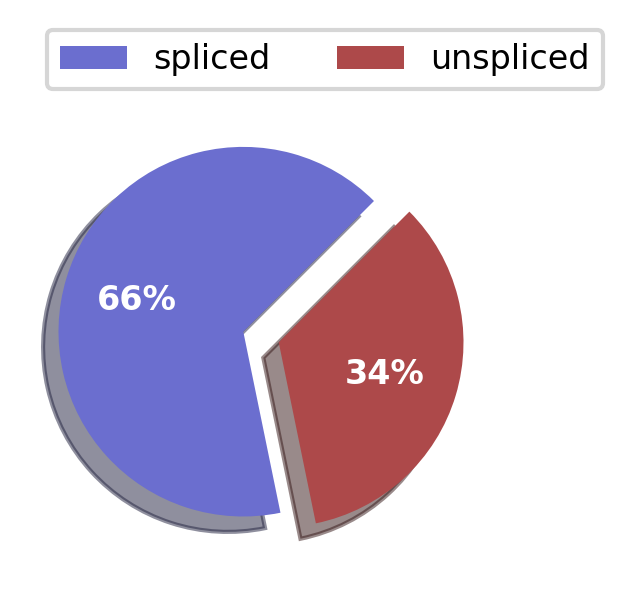

computing neighbors
    finished (0:00:06) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Mono-kinetic_1to path :./1_simulation_datasets/Mono-kinetic_1.h5ad
['simulation038' 'simulation326' 'simulation414' 'simulation567'
 'simulation586' 'simulation681' 'simulation721' 'simulation757'
 'simulation906']
./2_Figure/Mono-kinetic_1.groundtruth_gene_example.pdf


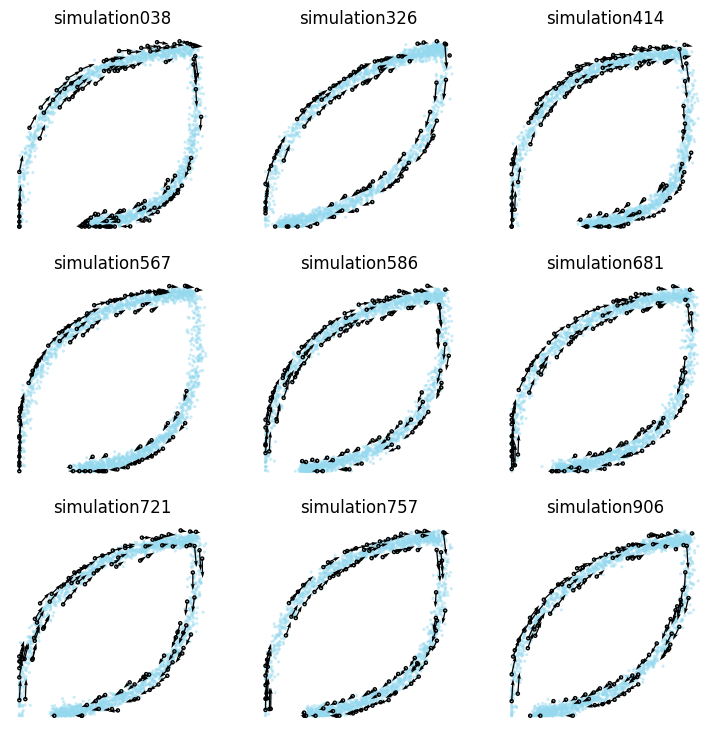

*************************************
Transcriptional_boost_1
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Transcriptional_boost_1to path :./1_simulation_datasets/Transcriptional_boost_1.csv


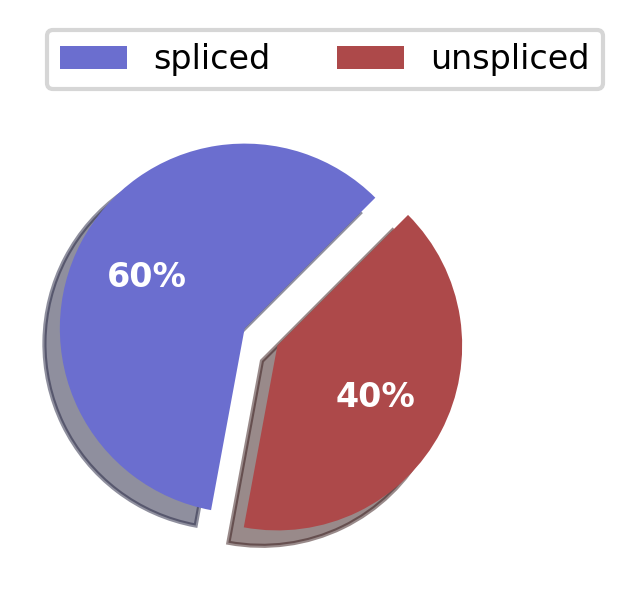

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Transcriptional_boost_1to path :./1_simulation_datasets/Transcriptional_boost_1.h5ad
['simulation038' 'simulation326' 'simulation414' 'simulation567'
 'simulation586' 'simulation681' 'simulation721' 'simulation757'
 'simulation906']
./2_Figure/Transcriptional_boost_1.groundtruth_gene_example.pdf


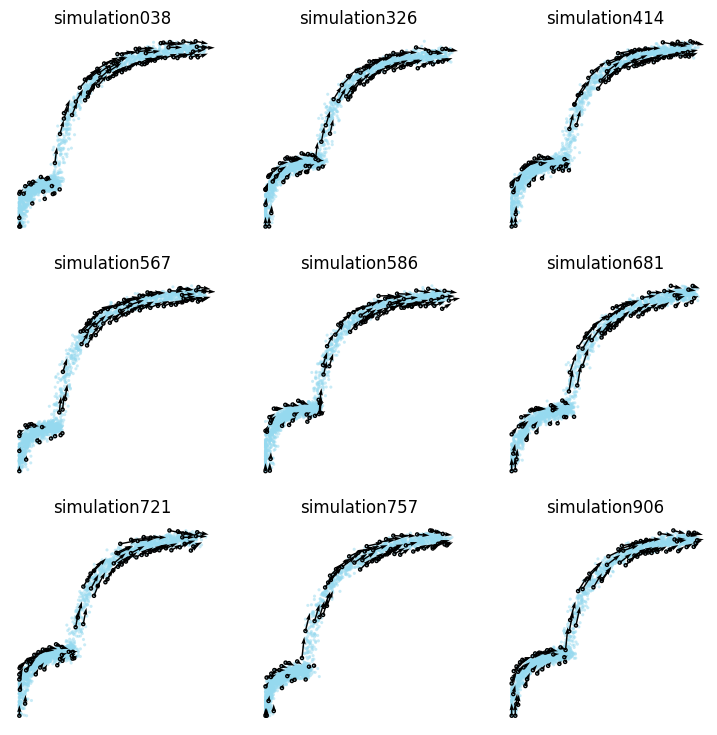

*************************************
Multi-forward_branching_1
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Multi-forward_branching_1to path :./1_simulation_datasets/Multi-forward_branching_1.csv


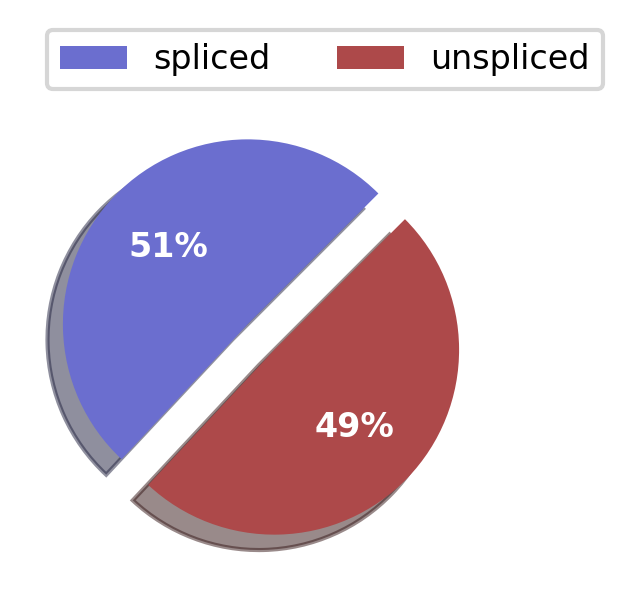

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Multi-forward_branching_1to path :./1_simulation_datasets/Multi-forward_branching_1.h5ad
['simulation038' 'simulation326' 'simulation414' 'simulation567'
 'simulation586' 'simulation681' 'simulation721' 'simulation757'
 'simulation906']
./2_Figure/Multi-forward_branching_1.groundtruth_gene_example.pdf


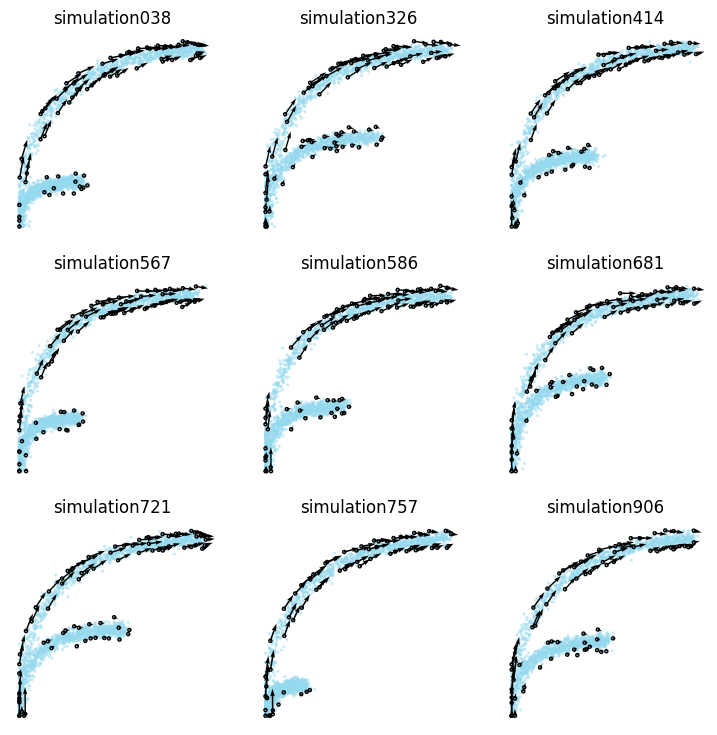

*************************************
Multi-backward_branching_1
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Multi-backward_branching_1to path :./1_simulation_datasets/Multi-backward_branching_1.csv


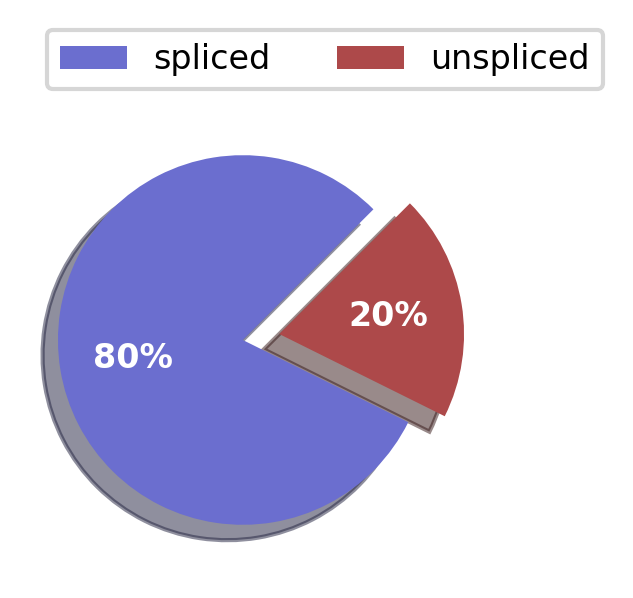

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Multi-backward_branching_1to path :./1_simulation_datasets/Multi-backward_branching_1.h5ad
['simulation038' 'simulation326' 'simulation414' 'simulation567'
 'simulation586' 'simulation681' 'simulation721' 'simulation757'
 'simulation906']
./2_Figure/Multi-backward_branching_1.groundtruth_gene_example.pdf


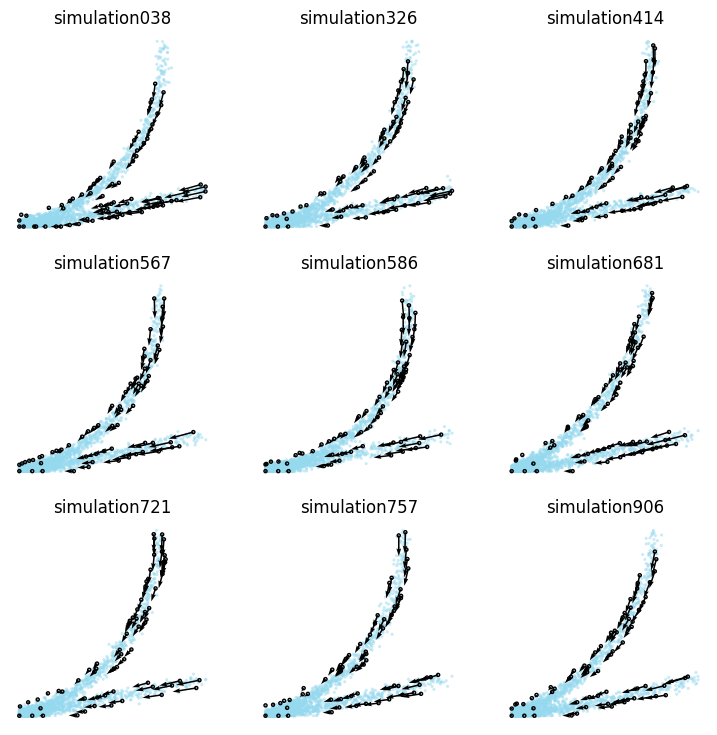

*************************************
Mono-kinetic_2
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Mono-kinetic_2to path :./1_simulation_datasets/Mono-kinetic_2.csv


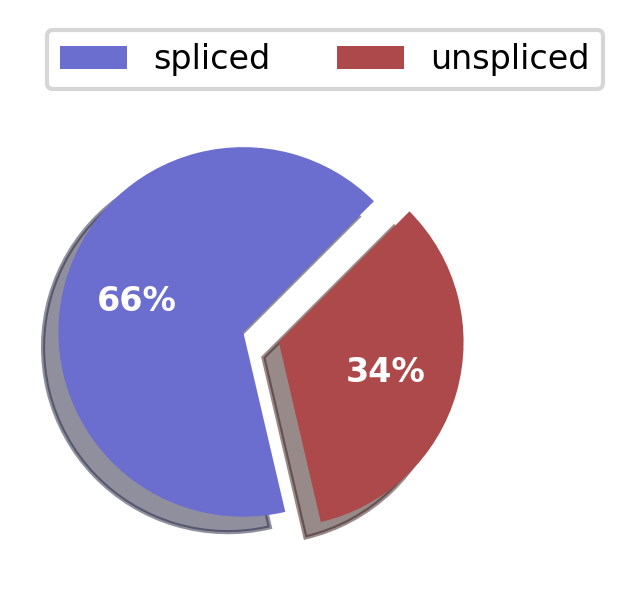

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Mono-kinetic_2to path :./1_simulation_datasets/Mono-kinetic_2.h5ad
['simulation179' 'simulation213' 'simulation490' 'simulation523'
 'simulation633' 'simulation743' 'simulation893' 'simulation929'
 'simulation941']
./2_Figure/Mono-kinetic_2.groundtruth_gene_example.pdf


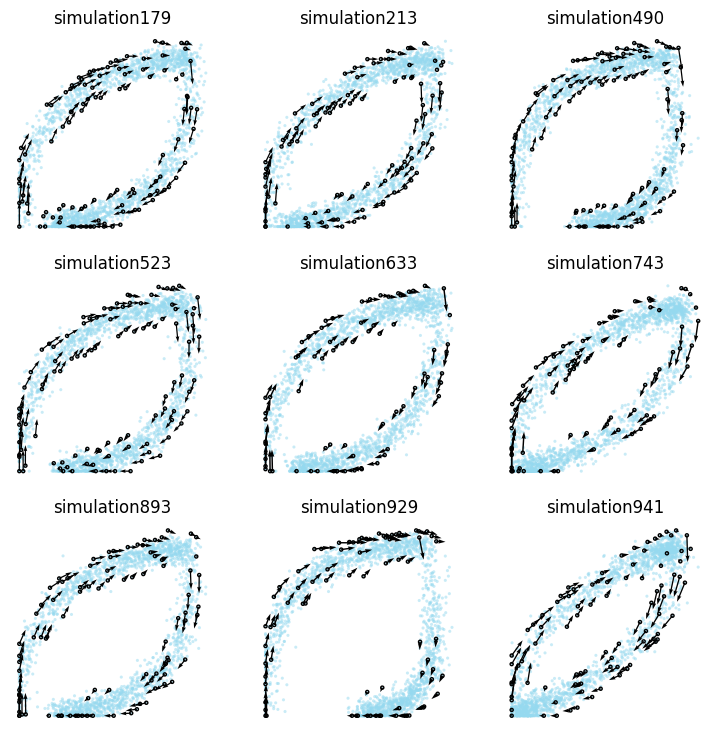

*************************************
Transcriptional_boost_2
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Transcriptional_boost_2to path :./1_simulation_datasets/Transcriptional_boost_2.csv


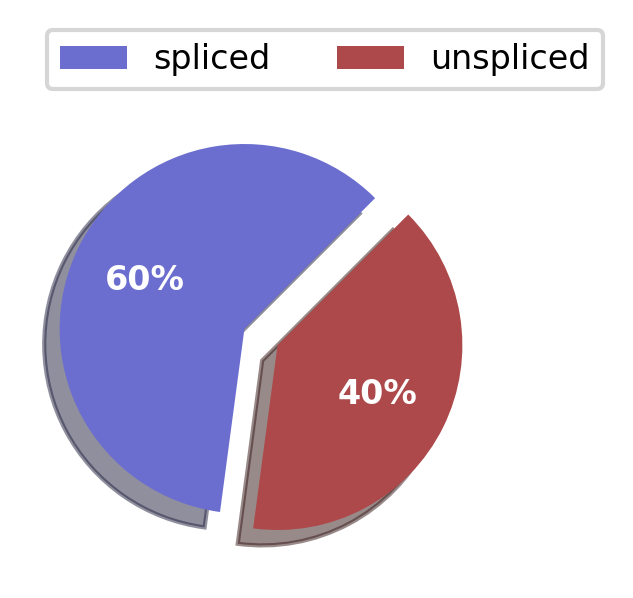

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Transcriptional_boost_2to path :./1_simulation_datasets/Transcriptional_boost_2.h5ad
['simulation038' 'simulation326' 'simulation414' 'simulation567'
 'simulation586' 'simulation681' 'simulation721' 'simulation757'
 'simulation906']
./2_Figure/Transcriptional_boost_2.groundtruth_gene_example.pdf


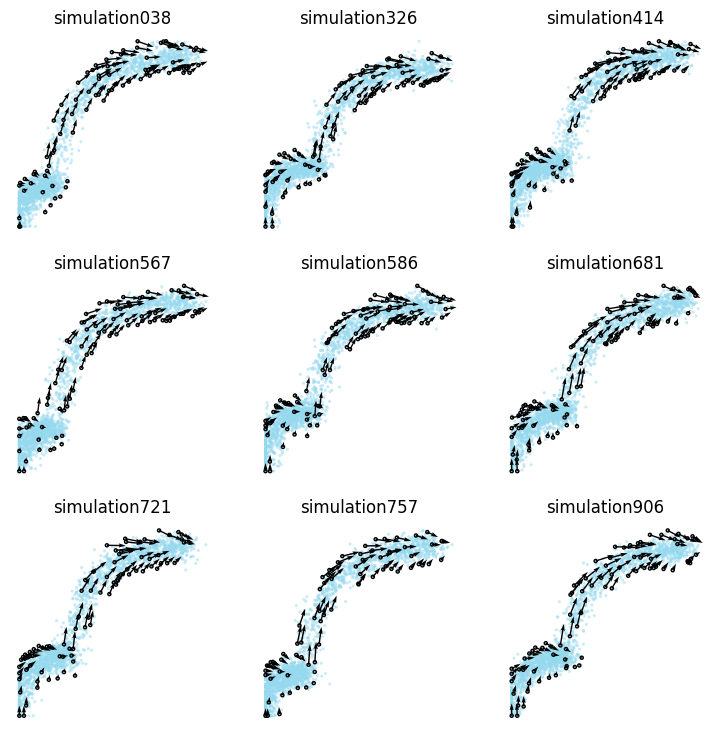

*************************************
Multi-forward_branching_2
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Multi-forward_branching_2to path :./1_simulation_datasets/Multi-forward_branching_2.csv


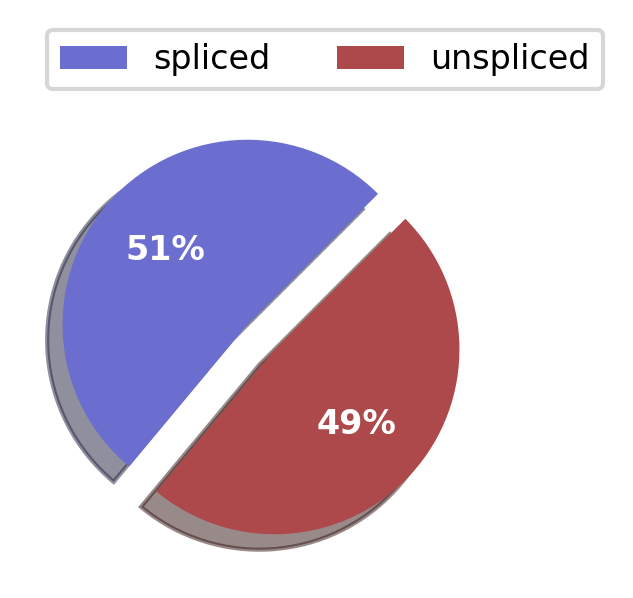

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Multi-forward_branching_2to path :./1_simulation_datasets/Multi-forward_branching_2.h5ad
['simulation038' 'simulation326' 'simulation414' 'simulation567'
 'simulation586' 'simulation681' 'simulation721' 'simulation757'
 'simulation906']
./2_Figure/Multi-forward_branching_2.groundtruth_gene_example.pdf


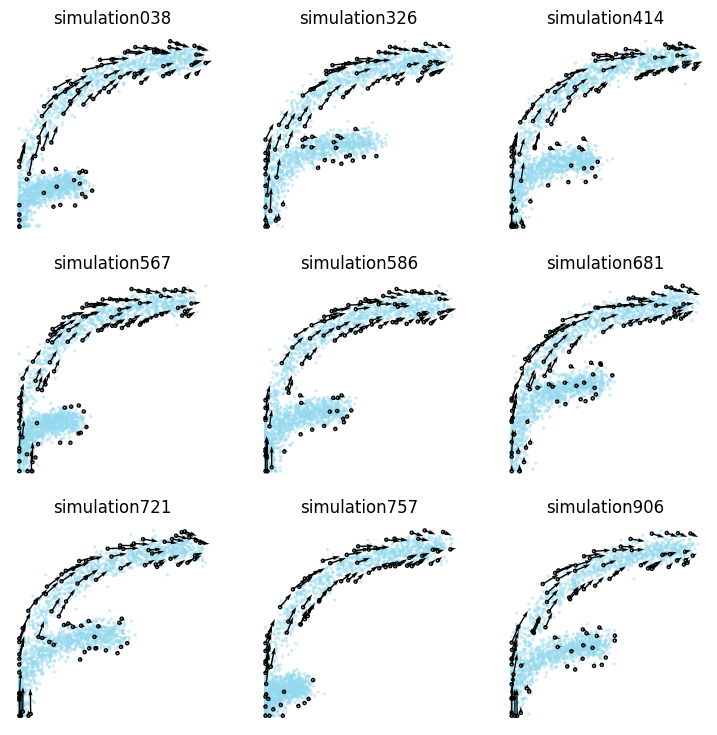

*************************************
Multi-backward_branching_2
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Multi-backward_branching_2to path :./1_simulation_datasets/Multi-backward_branching_2.csv


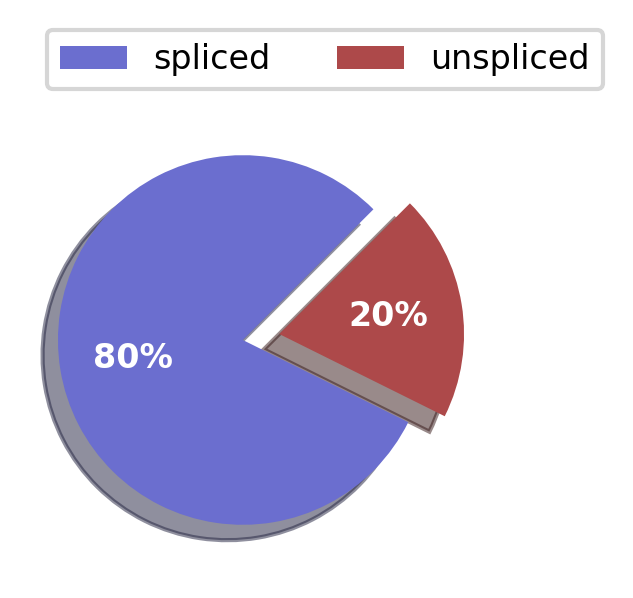

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Multi-backward_branching_2to path :./1_simulation_datasets/Multi-backward_branching_2.h5ad
['simulation038' 'simulation326' 'simulation414' 'simulation567'
 'simulation586' 'simulation681' 'simulation721' 'simulation757'
 'simulation906']
./2_Figure/Multi-backward_branching_2.groundtruth_gene_example.pdf


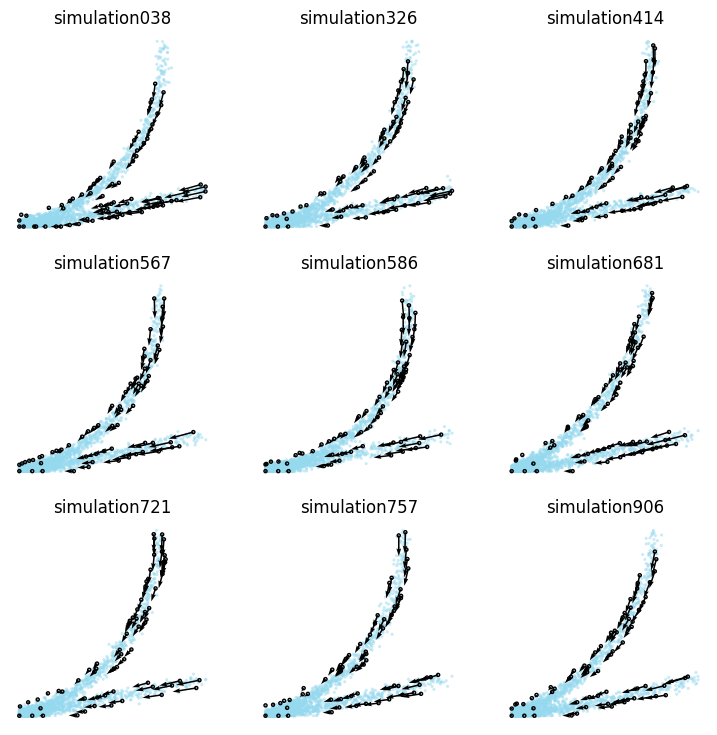

*************************************
Mono-kinetic_3
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Mono-kinetic_3to path :./1_simulation_datasets/Mono-kinetic_3.csv


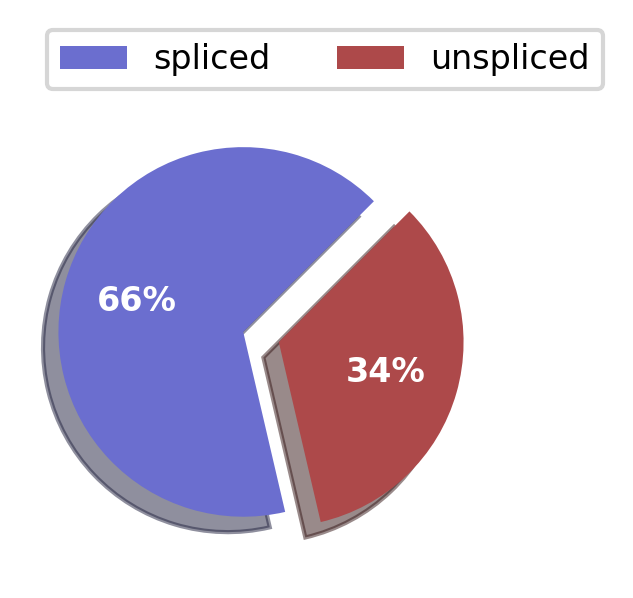

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Mono-kinetic_3to path :./1_simulation_datasets/Mono-kinetic_3.h5ad
['simulation352' 'simulation402' 'simulation403' 'simulation532'
 'simulation651' 'simulation862' 'simulation943' 'simulation962'
 'simulation982']
./2_Figure/Mono-kinetic_3.groundtruth_gene_example.pdf


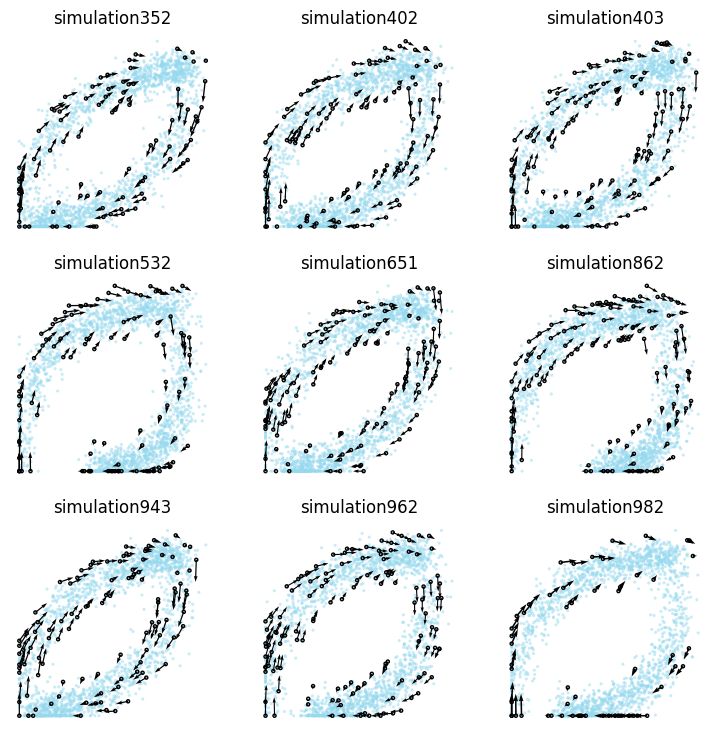

*************************************
Transcriptional_boost_3
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Transcriptional_boost_3to path :./1_simulation_datasets/Transcriptional_boost_3.csv


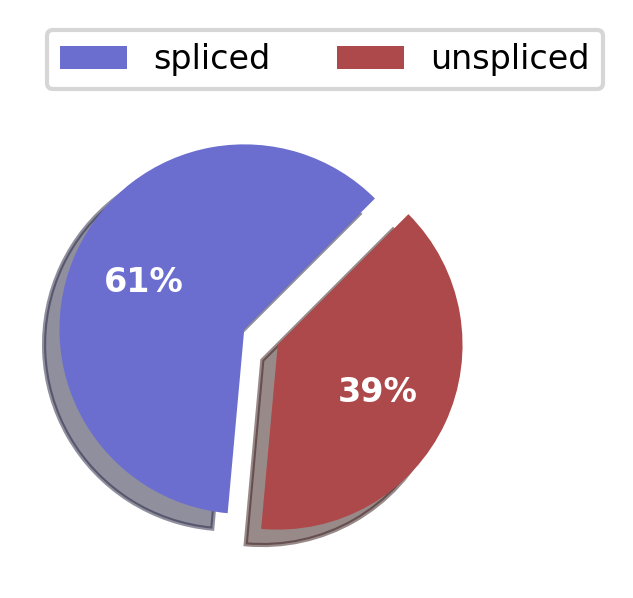

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Transcriptional_boost_3to path :./1_simulation_datasets/Transcriptional_boost_3.h5ad
['simulation125' 'simulation127' 'simulation235' 'simulation261'
 'simulation502' 'simulation699' 'simulation957' 'simulation986'
 'simulation996']
./2_Figure/Transcriptional_boost_3.groundtruth_gene_example.pdf


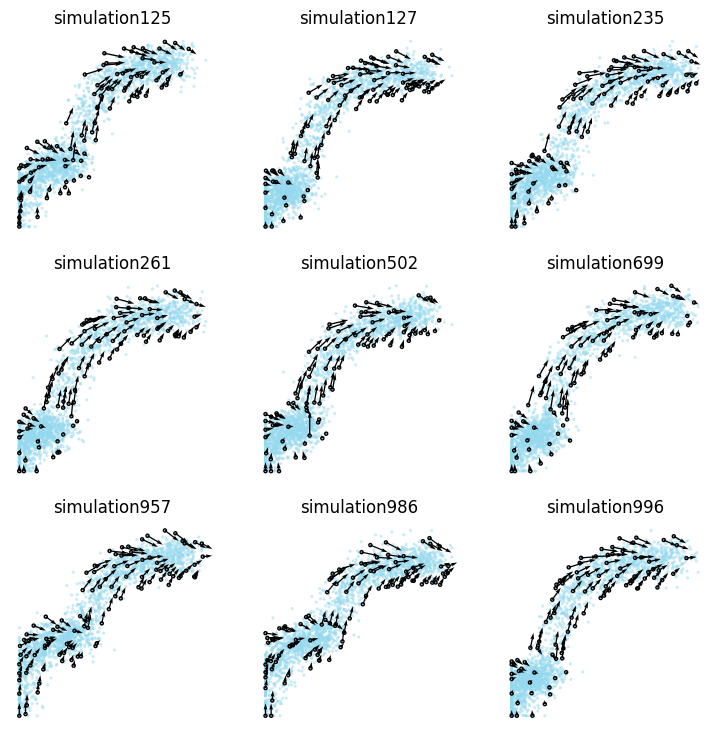

*************************************
Multi-forward_branching_3
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Multi-forward_branching_3to path :./1_simulation_datasets/Multi-forward_branching_3.csv


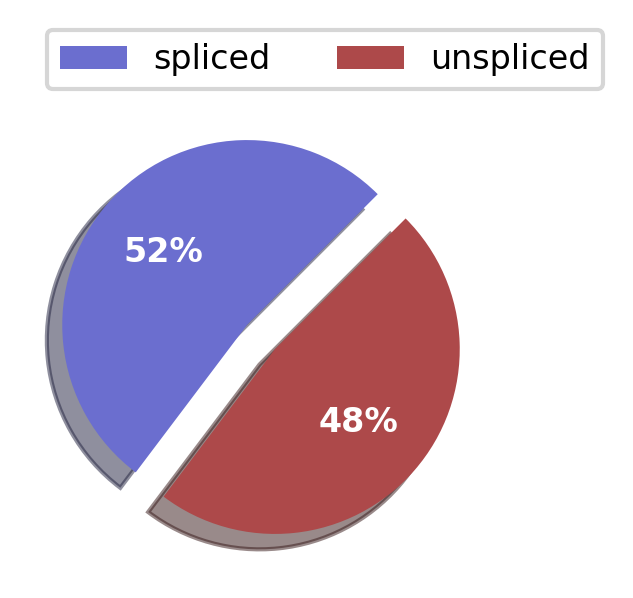

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Multi-forward_branching_3to path :./1_simulation_datasets/Multi-forward_branching_3.h5ad
['simulation125' 'simulation127' 'simulation235' 'simulation261'
 'simulation502' 'simulation699' 'simulation957' 'simulation986'
 'simulation996']
./2_Figure/Multi-forward_branching_3.groundtruth_gene_example.pdf


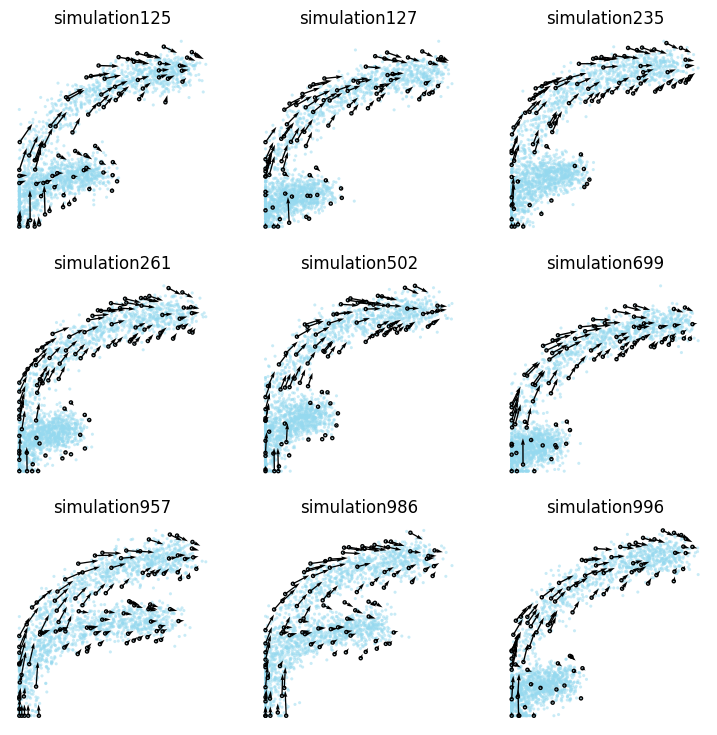

*************************************
Multi-backward_branching_3
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Multi-backward_branching_3to path :./1_simulation_datasets/Multi-backward_branching_3.csv


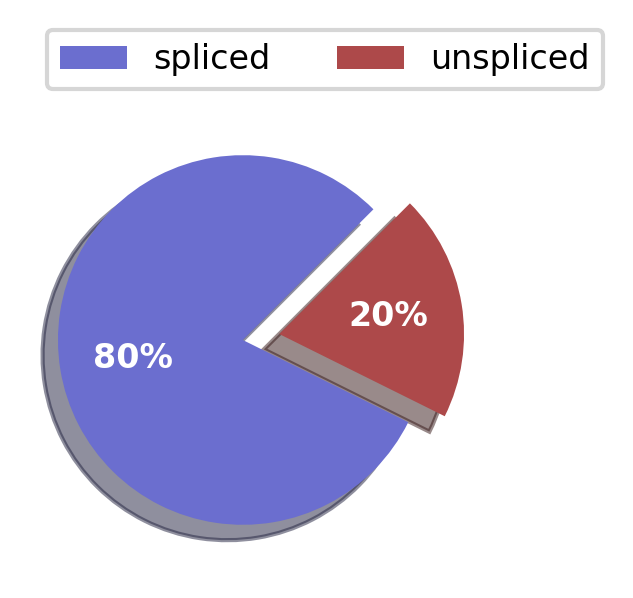

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Multi-backward_branching_3to path :./1_simulation_datasets/Multi-backward_branching_3.h5ad
['simulation038' 'simulation326' 'simulation414' 'simulation567'
 'simulation586' 'simulation681' 'simulation721' 'simulation757'
 'simulation906']
./2_Figure/Multi-backward_branching_3.groundtruth_gene_example.pdf


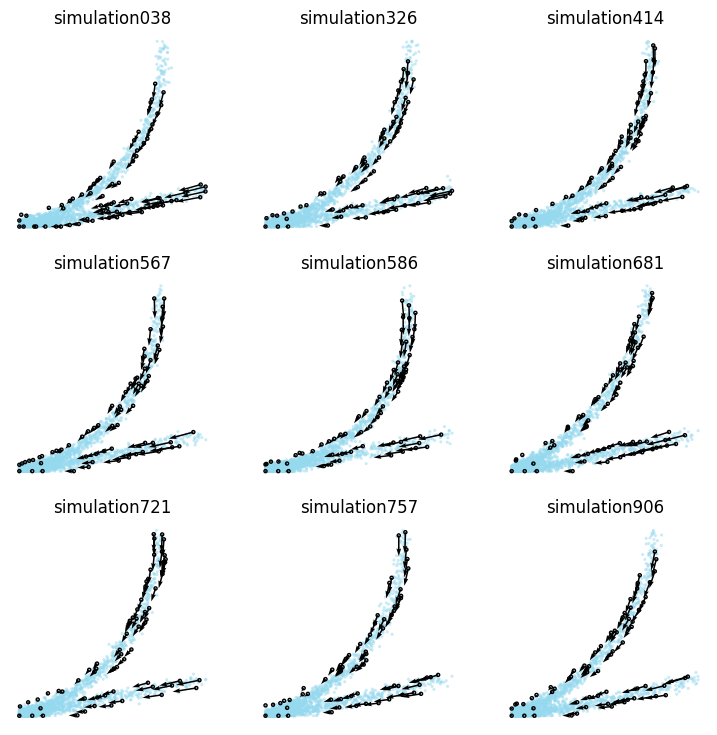

*************************************
Mono-kinetic_4
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Mono-kinetic_4to path :./1_simulation_datasets/Mono-kinetic_4.csv


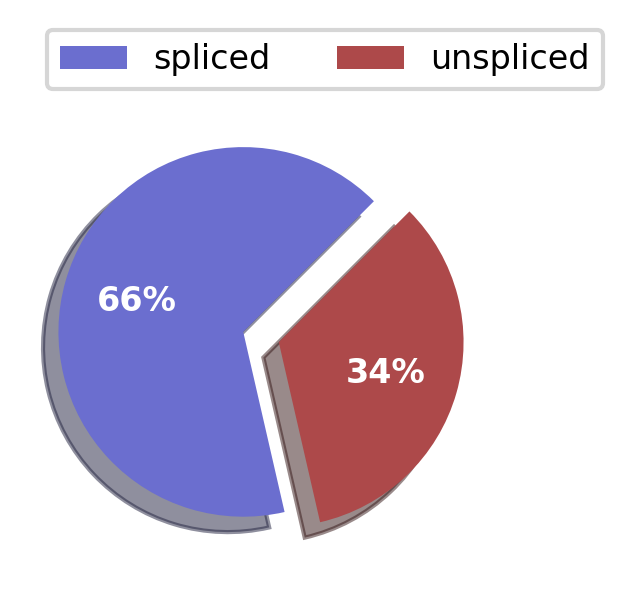

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Mono-kinetic_4to path :./1_simulation_datasets/Mono-kinetic_4.h5ad
['simulation352' 'simulation402' 'simulation403' 'simulation532'
 'simulation651' 'simulation862' 'simulation943' 'simulation962'
 'simulation982']
./2_Figure/Mono-kinetic_4.groundtruth_gene_example.pdf


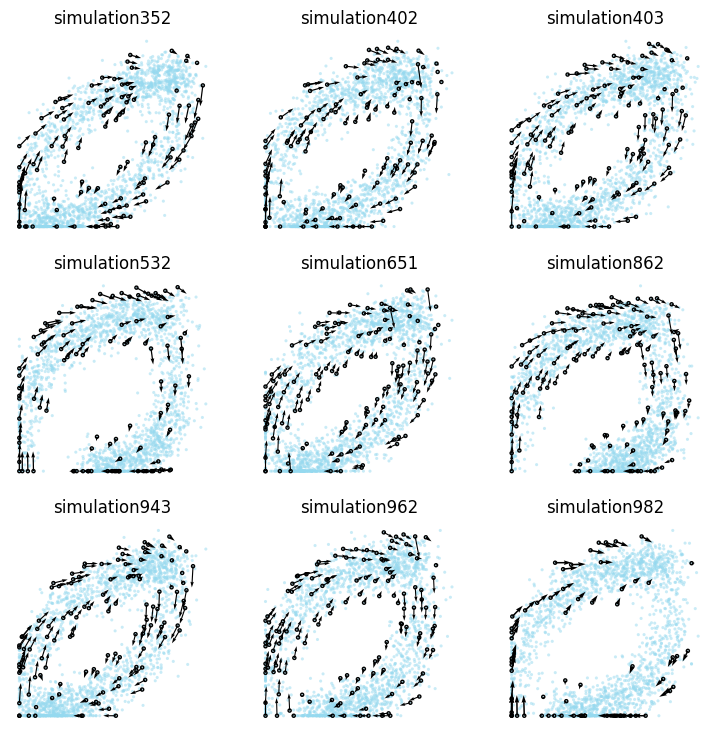

*************************************
Transcriptional_boost_4
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Transcriptional_boost_4to path :./1_simulation_datasets/Transcriptional_boost_4.csv


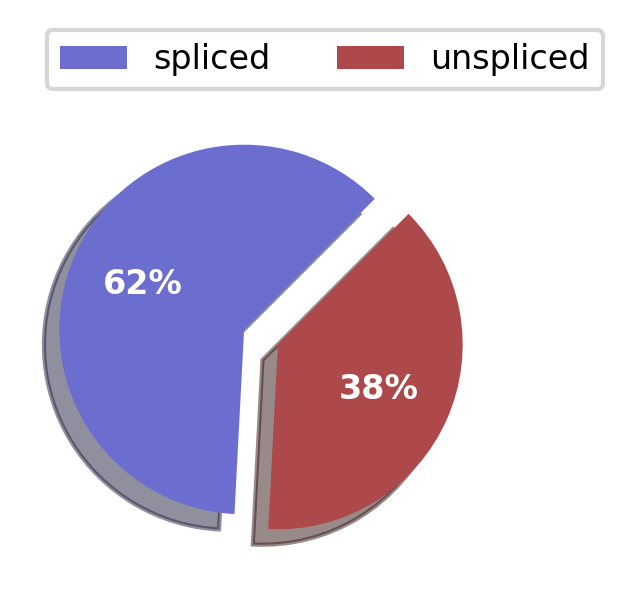

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Transcriptional_boost_4to path :./1_simulation_datasets/Transcriptional_boost_4.h5ad
['simulation352' 'simulation402' 'simulation403' 'simulation532'
 'simulation651' 'simulation862' 'simulation943' 'simulation962'
 'simulation982']
./2_Figure/Transcriptional_boost_4.groundtruth_gene_example.pdf


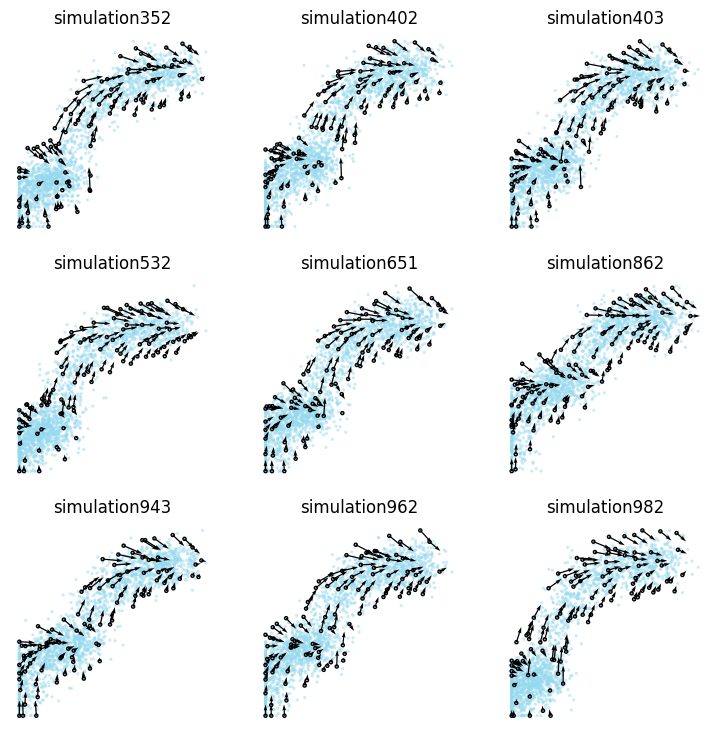

*************************************
Multi-forward_branching_4
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Multi-forward_branching_4to path :./1_simulation_datasets/Multi-forward_branching_4.csv


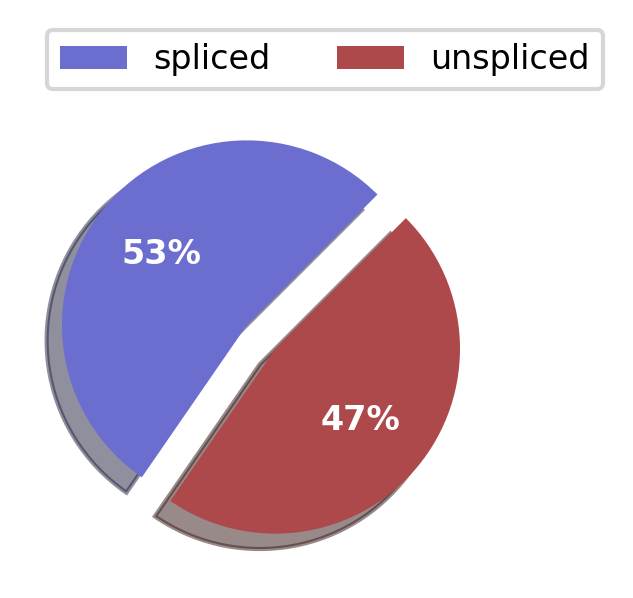

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Multi-forward_branching_4to path :./1_simulation_datasets/Multi-forward_branching_4.h5ad
['simulation352' 'simulation402' 'simulation403' 'simulation532'
 'simulation651' 'simulation862' 'simulation943' 'simulation962'
 'simulation982']
./2_Figure/Multi-forward_branching_4.groundtruth_gene_example.pdf


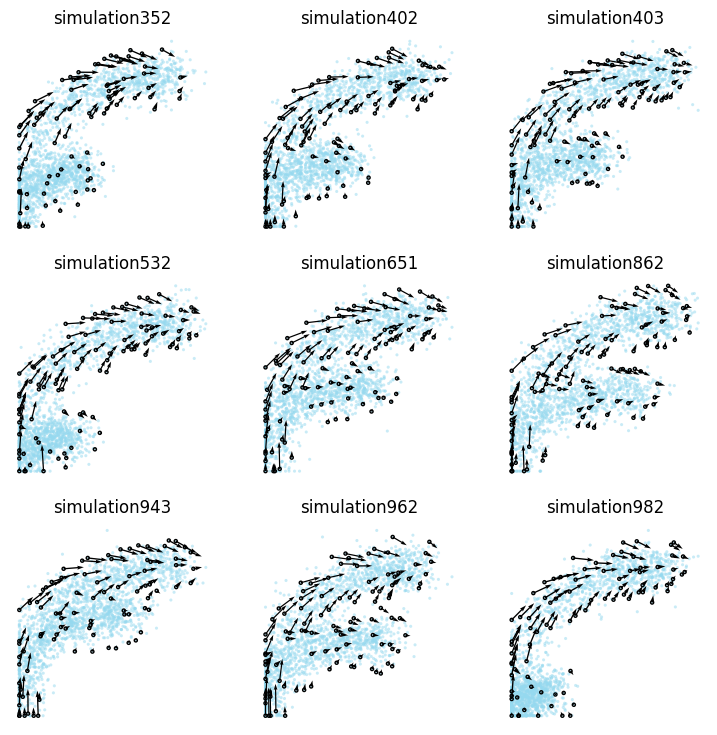

*************************************
Multi-backward_branching_4
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Multi-backward_branching_4to path :./1_simulation_datasets/Multi-backward_branching_4.csv


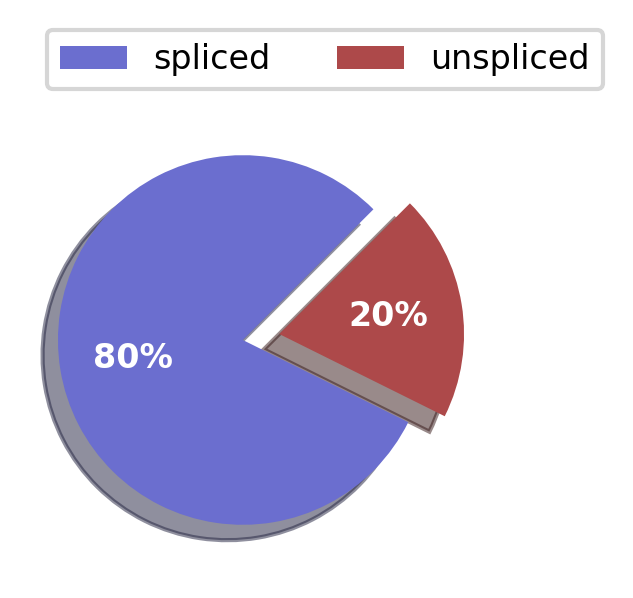

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Multi-backward_branching_4to path :./1_simulation_datasets/Multi-backward_branching_4.h5ad
['simulation038' 'simulation326' 'simulation414' 'simulation567'
 'simulation586' 'simulation681' 'simulation721' 'simulation757'
 'simulation906']
./2_Figure/Multi-backward_branching_4.groundtruth_gene_example.pdf


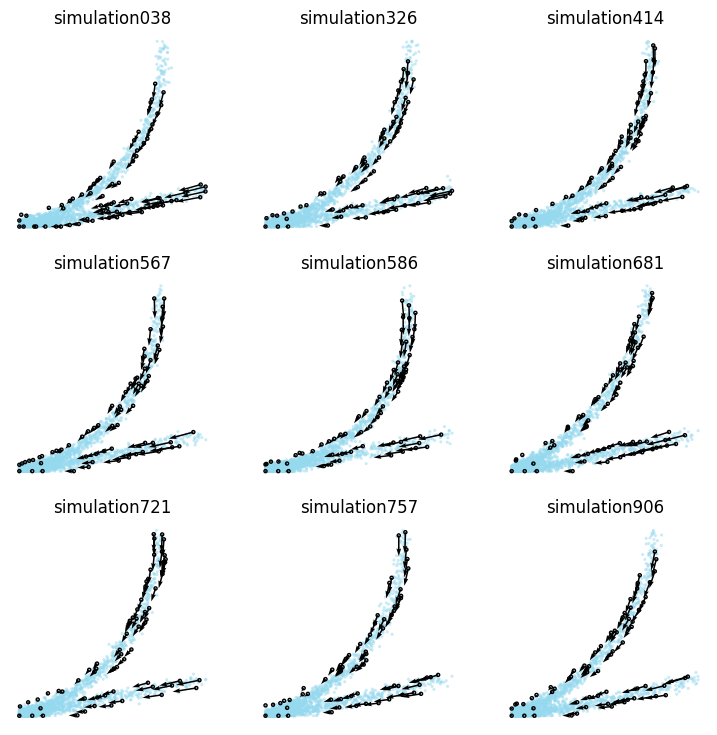

*************************************
Mono-kinetic_5
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Mono-kinetic_5to path :./1_simulation_datasets/Mono-kinetic_5.csv


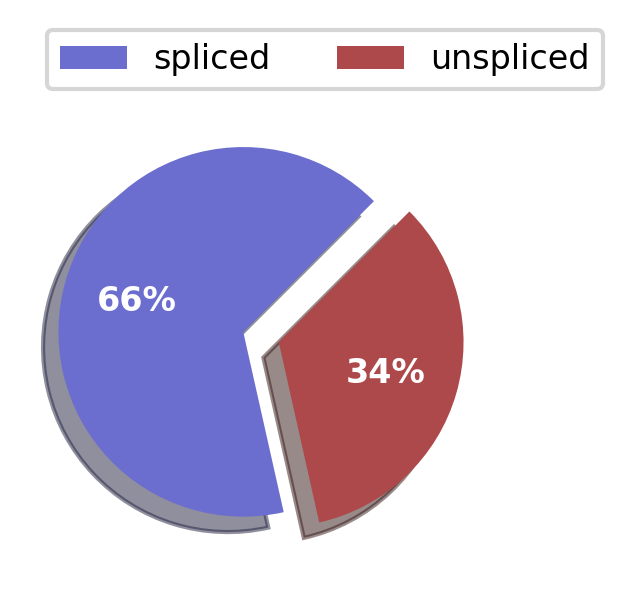

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Mono-kinetic_5to path :./1_simulation_datasets/Mono-kinetic_5.h5ad
['simulation352' 'simulation402' 'simulation403' 'simulation532'
 'simulation651' 'simulation862' 'simulation943' 'simulation962'
 'simulation982']
./2_Figure/Mono-kinetic_5.groundtruth_gene_example.pdf


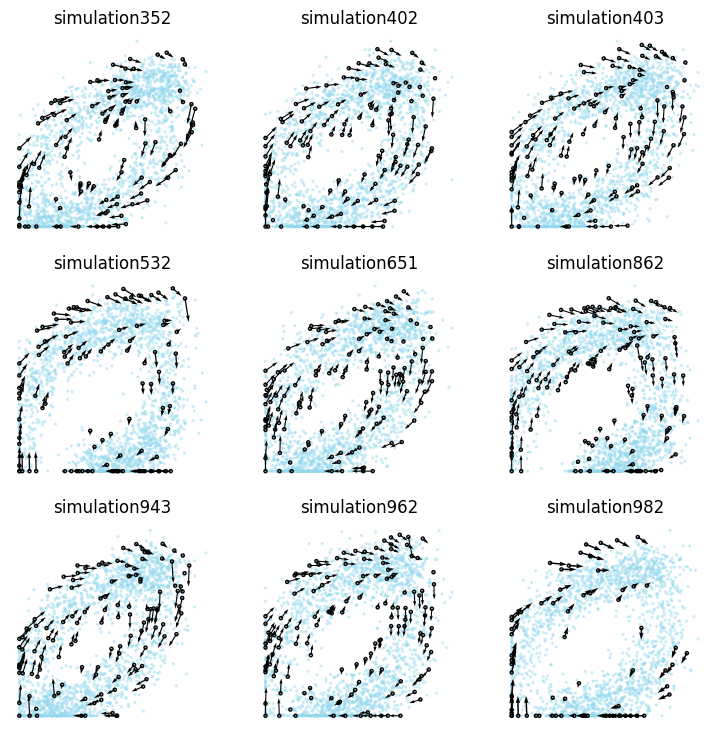

*************************************
Transcriptional_boost_5
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Transcriptional_boost_5to path :./1_simulation_datasets/Transcriptional_boost_5.csv


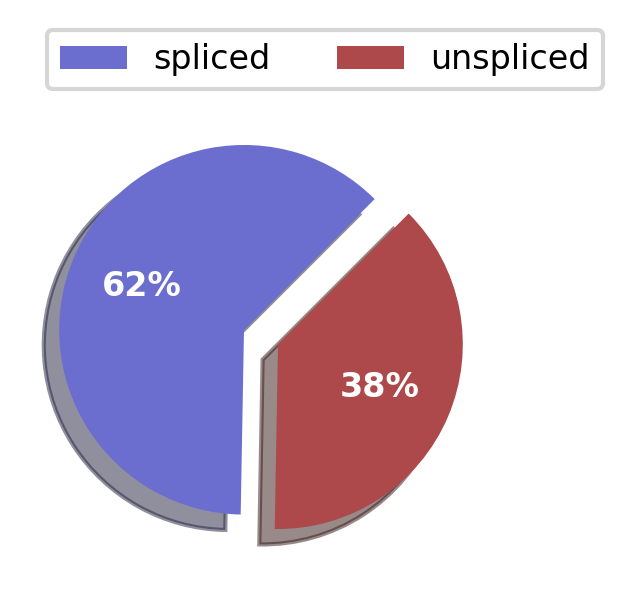

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Transcriptional_boost_5to path :./1_simulation_datasets/Transcriptional_boost_5.h5ad
['simulation352' 'simulation402' 'simulation403' 'simulation532'
 'simulation651' 'simulation862' 'simulation943' 'simulation962'
 'simulation982']
./2_Figure/Transcriptional_boost_5.groundtruth_gene_example.pdf


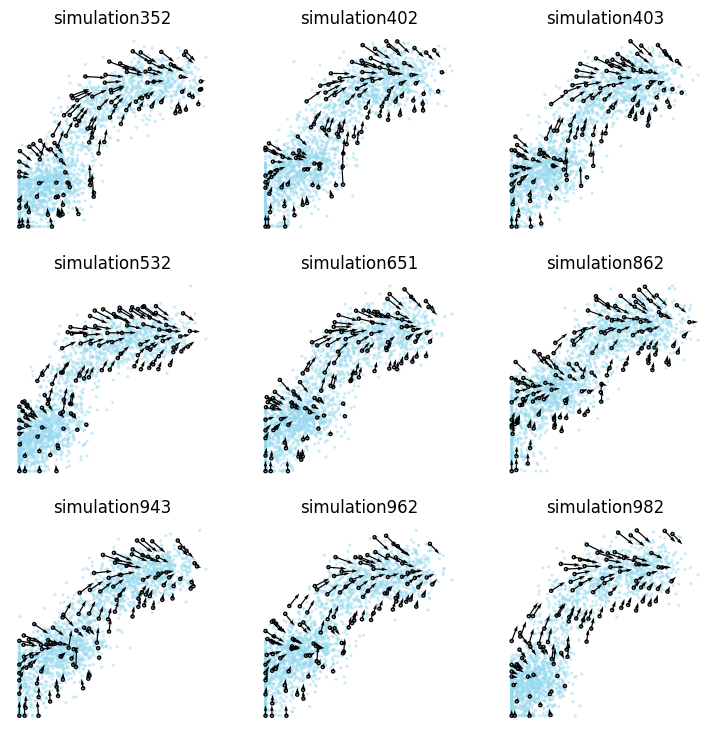

*************************************
Multi-forward_branching_5
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Multi-forward_branching_5to path :./1_simulation_datasets/Multi-forward_branching_5.csv


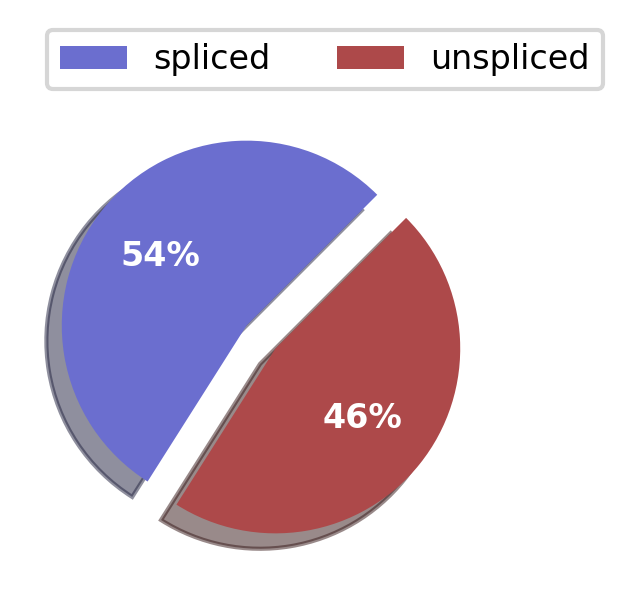

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Multi-forward_branching_5to path :./1_simulation_datasets/Multi-forward_branching_5.h5ad
['simulation352' 'simulation402' 'simulation403' 'simulation532'
 'simulation651' 'simulation862' 'simulation943' 'simulation962'
 'simulation982']
./2_Figure/Multi-forward_branching_5.groundtruth_gene_example.pdf


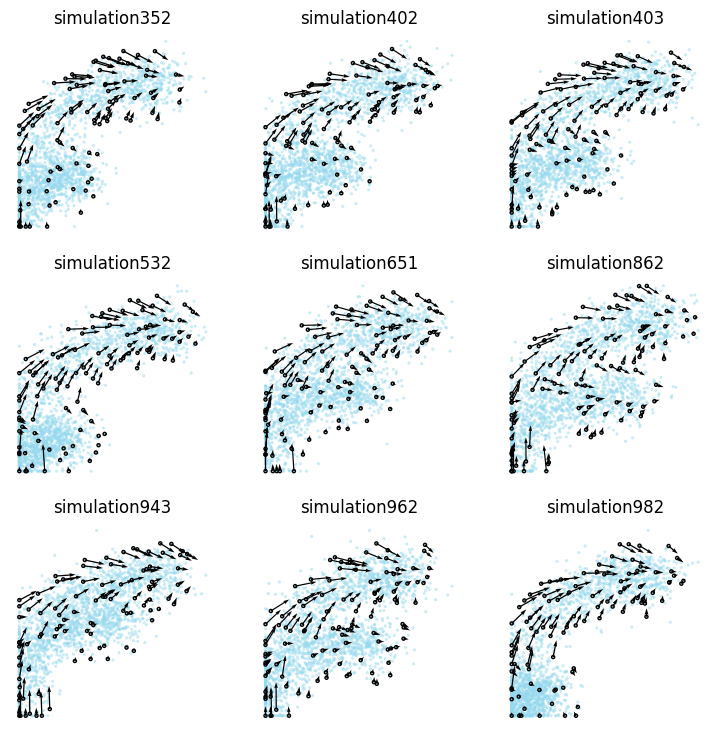

*************************************
Multi-backward_branching_5
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Multi-backward_branching_5to path :./1_simulation_datasets/Multi-backward_branching_5.csv


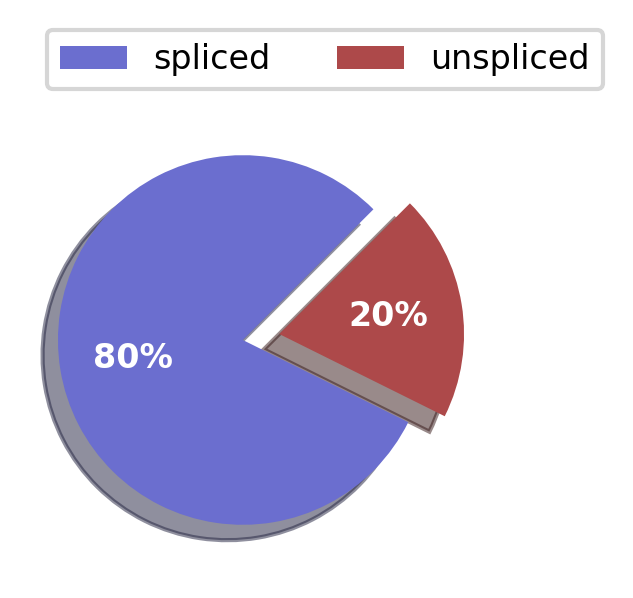

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Multi-backward_branching_5to path :./1_simulation_datasets/Multi-backward_branching_5.h5ad
['simulation038' 'simulation326' 'simulation414' 'simulation567'
 'simulation586' 'simulation681' 'simulation721' 'simulation757'
 'simulation906']
./2_Figure/Multi-backward_branching_5.groundtruth_gene_example.pdf


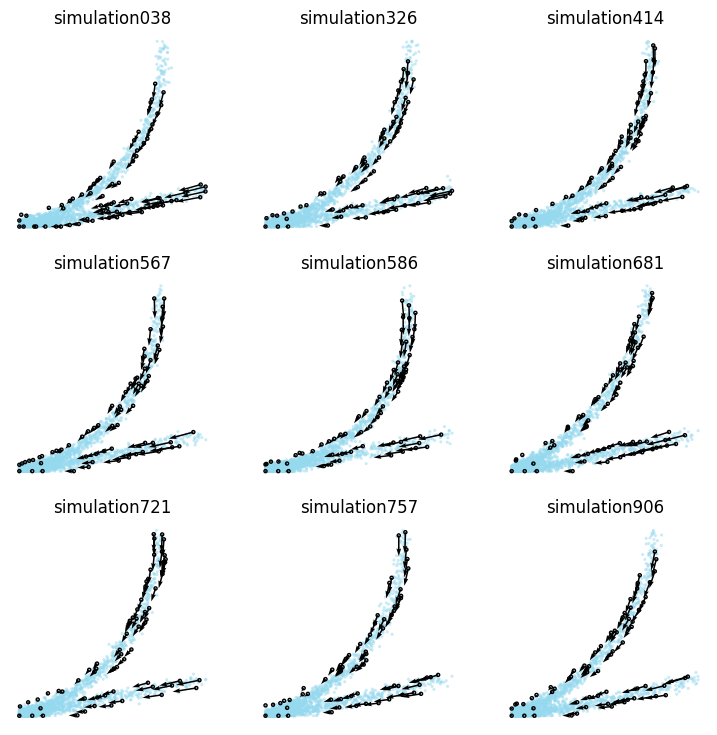

*************************************
Mono-kinetic_6
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Mono-kinetic_6to path :./1_simulation_datasets/Mono-kinetic_6.csv


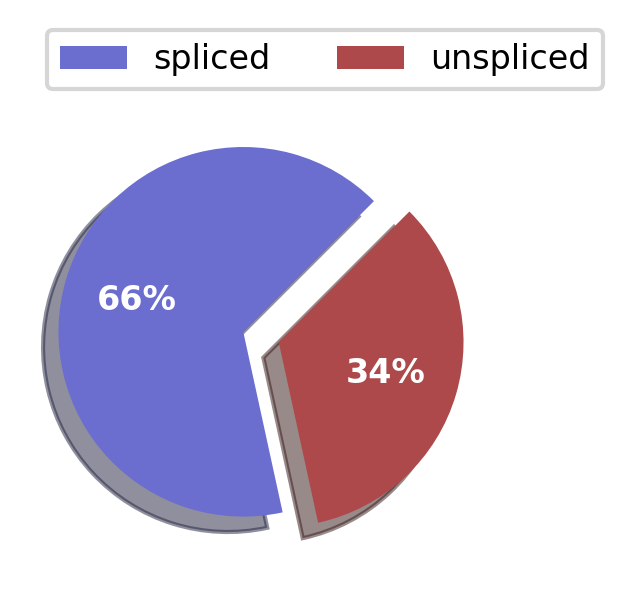

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Mono-kinetic_6to path :./1_simulation_datasets/Mono-kinetic_6.h5ad
['simulation352' 'simulation402' 'simulation403' 'simulation532'
 'simulation651' 'simulation862' 'simulation943' 'simulation962'
 'simulation982']
./2_Figure/Mono-kinetic_6.groundtruth_gene_example.pdf


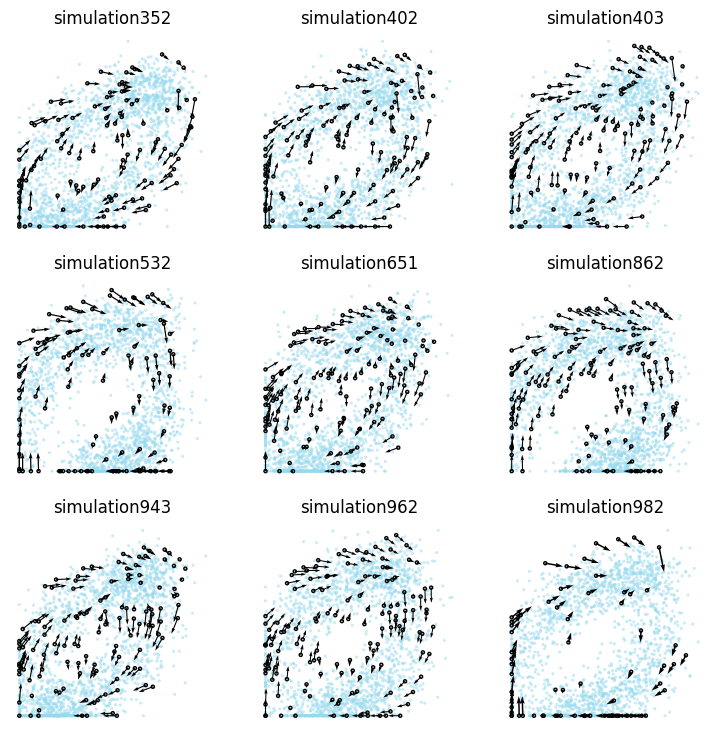

*************************************
Transcriptional_boost_6
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Transcriptional_boost_6to path :./1_simulation_datasets/Transcriptional_boost_6.csv


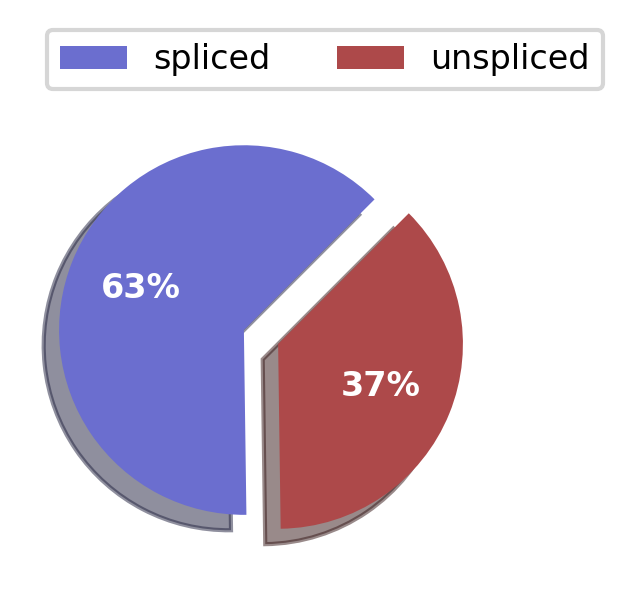

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Transcriptional_boost_6to path :./1_simulation_datasets/Transcriptional_boost_6.h5ad
['simulation352' 'simulation402' 'simulation403' 'simulation532'
 'simulation651' 'simulation862' 'simulation943' 'simulation962'
 'simulation982']
./2_Figure/Transcriptional_boost_6.groundtruth_gene_example.pdf


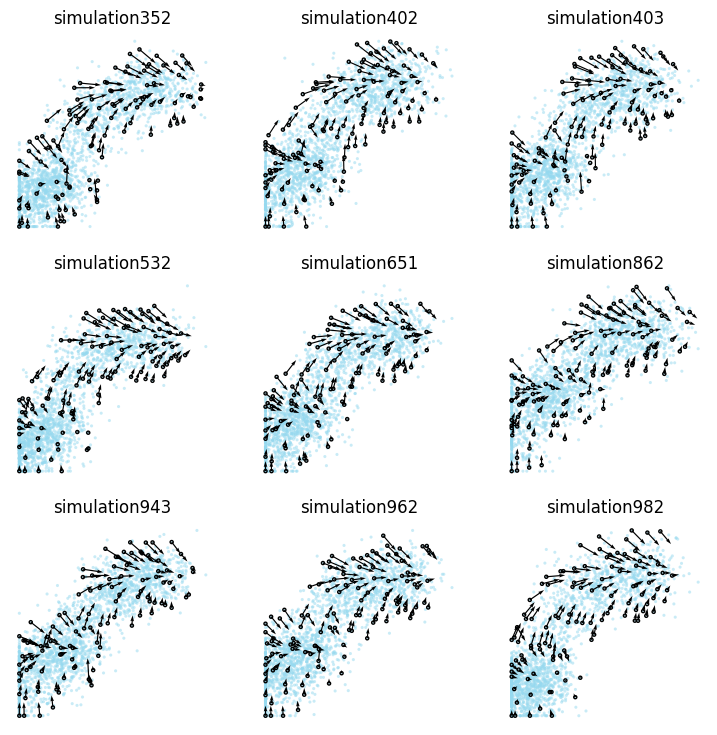

*************************************
Multi-forward_branching_6
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Multi-forward_branching_6to path :./1_simulation_datasets/Multi-forward_branching_6.csv


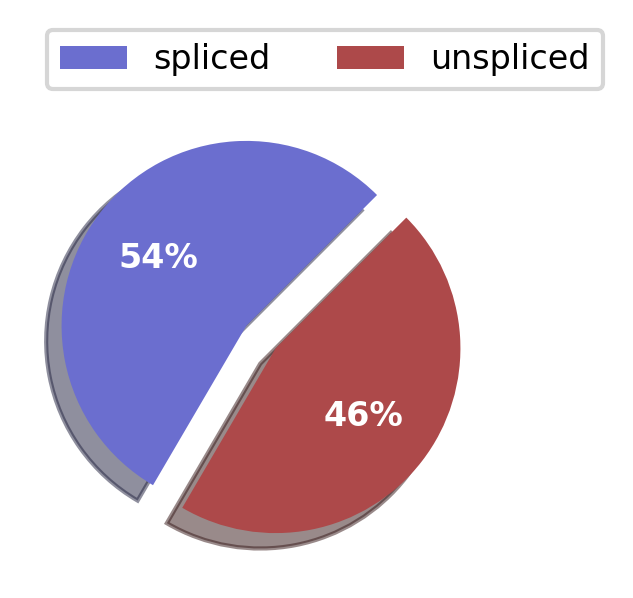

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Multi-forward_branching_6to path :./1_simulation_datasets/Multi-forward_branching_6.h5ad
['simulation352' 'simulation402' 'simulation403' 'simulation532'
 'simulation651' 'simulation862' 'simulation943' 'simulation962'
 'simulation982']
./2_Figure/Multi-forward_branching_6.groundtruth_gene_example.pdf


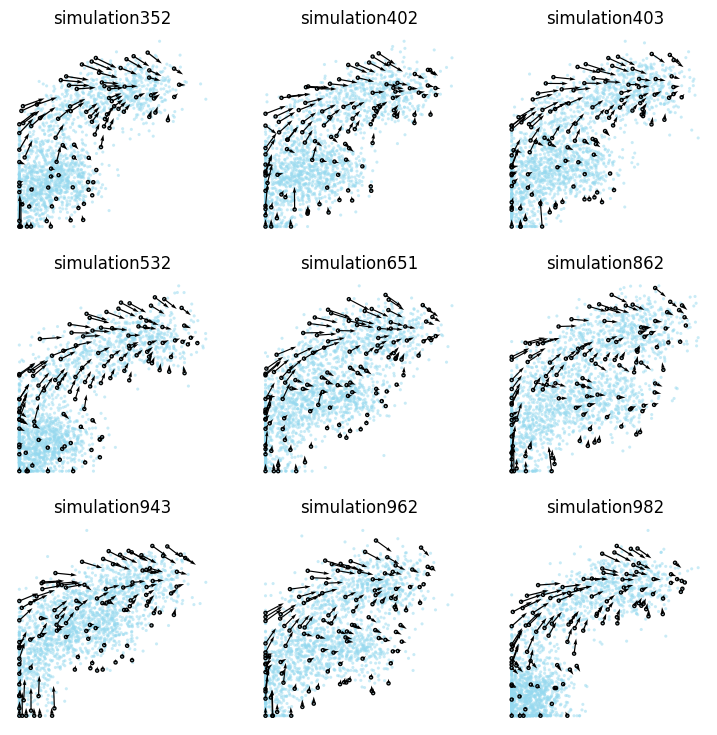

*************************************
Multi-backward_branching_6
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Multi-backward_branching_6to path :./1_simulation_datasets/Multi-backward_branching_6.csv


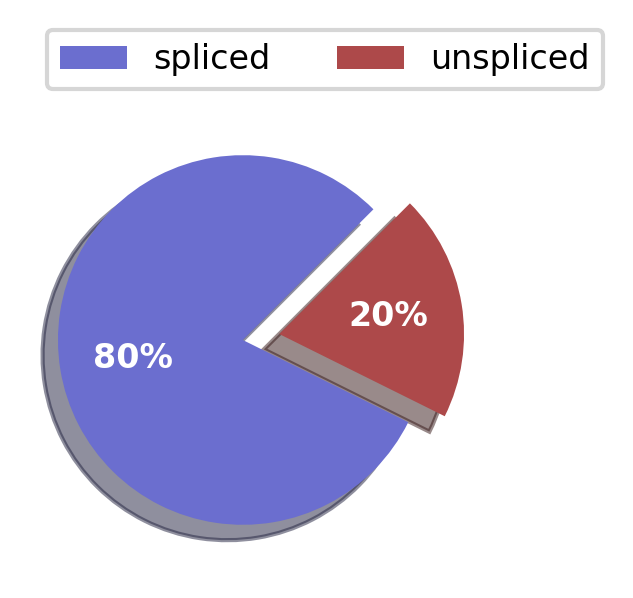

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Multi-backward_branching_6to path :./1_simulation_datasets/Multi-backward_branching_6.h5ad
['simulation038' 'simulation326' 'simulation414' 'simulation567'
 'simulation586' 'simulation681' 'simulation721' 'simulation757'
 'simulation906']
./2_Figure/Multi-backward_branching_6.groundtruth_gene_example.pdf


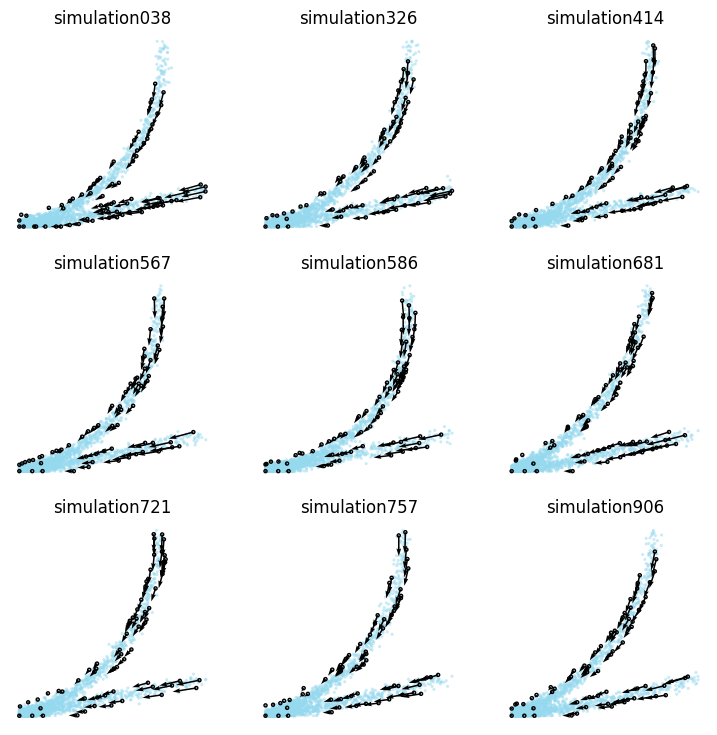

*************************************
Mono-kinetic_7
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Mono-kinetic_7to path :./1_simulation_datasets/Mono-kinetic_7.csv


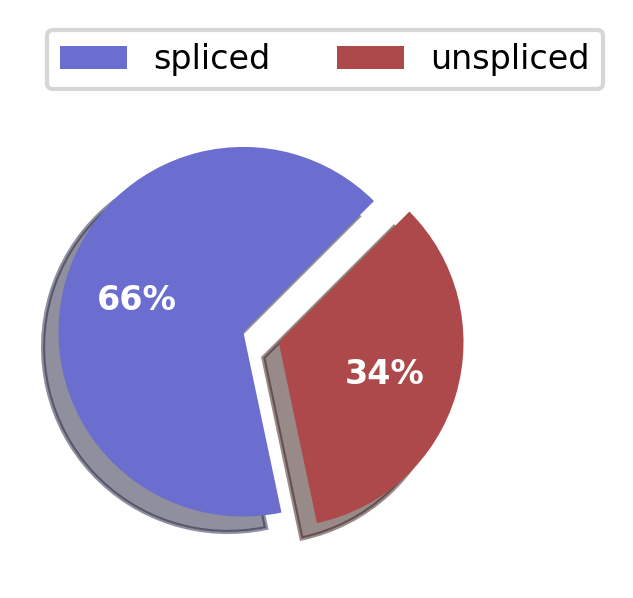

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Mono-kinetic_7to path :./1_simulation_datasets/Mono-kinetic_7.h5ad
['simulation352' 'simulation402' 'simulation403' 'simulation532'
 'simulation651' 'simulation862' 'simulation943' 'simulation962'
 'simulation982']
./2_Figure/Mono-kinetic_7.groundtruth_gene_example.pdf


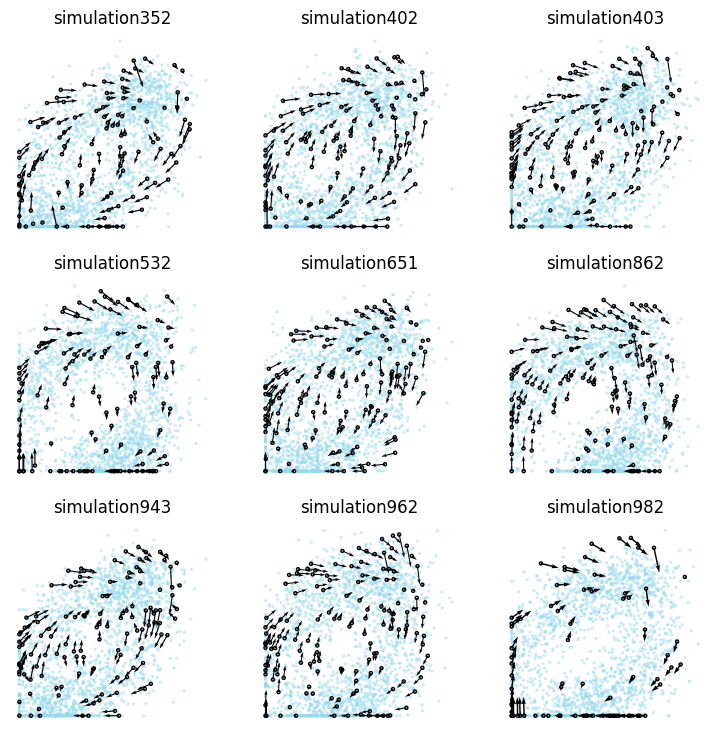

*************************************
Transcriptional_boost_7
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Transcriptional_boost_7to path :./1_simulation_datasets/Transcriptional_boost_7.csv


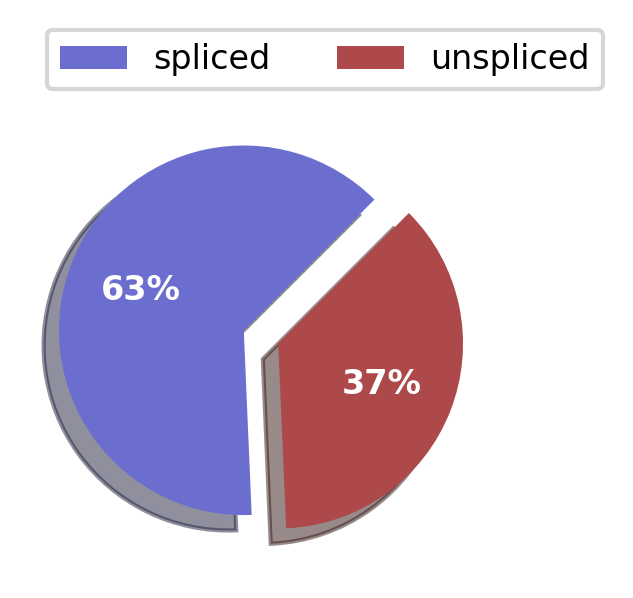

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Transcriptional_boost_7to path :./1_simulation_datasets/Transcriptional_boost_7.h5ad
['simulation352' 'simulation402' 'simulation403' 'simulation532'
 'simulation651' 'simulation862' 'simulation943' 'simulation962'
 'simulation982']
./2_Figure/Transcriptional_boost_7.groundtruth_gene_example.pdf


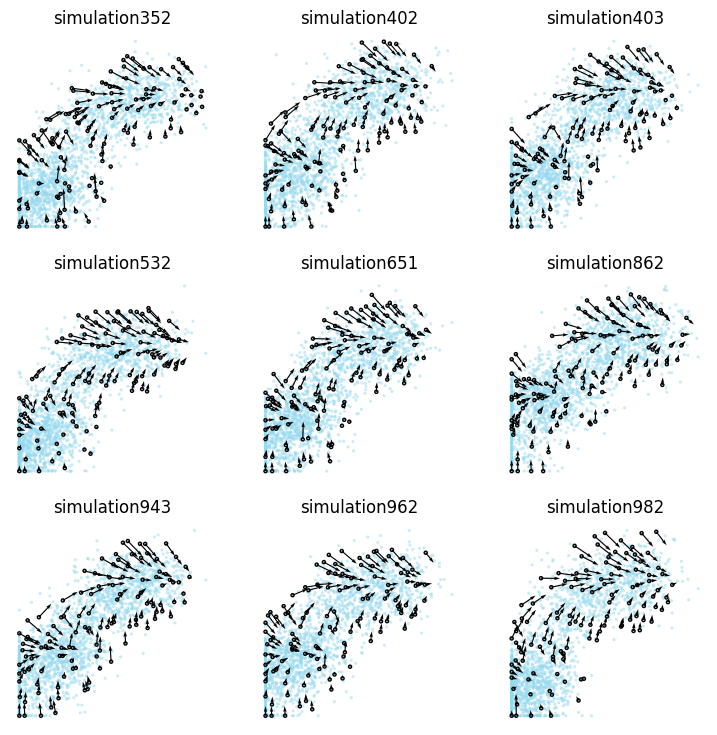

*************************************
Multi-forward_branching_7
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Multi-forward_branching_7to path :./1_simulation_datasets/Multi-forward_branching_7.csv


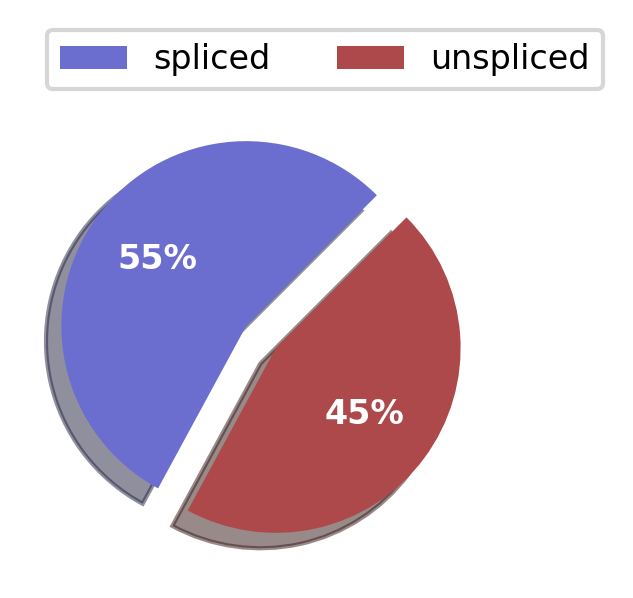

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Multi-forward_branching_7to path :./1_simulation_datasets/Multi-forward_branching_7.h5ad
['simulation352' 'simulation402' 'simulation403' 'simulation532'
 'simulation651' 'simulation862' 'simulation943' 'simulation962'
 'simulation982']
./2_Figure/Multi-forward_branching_7.groundtruth_gene_example.pdf


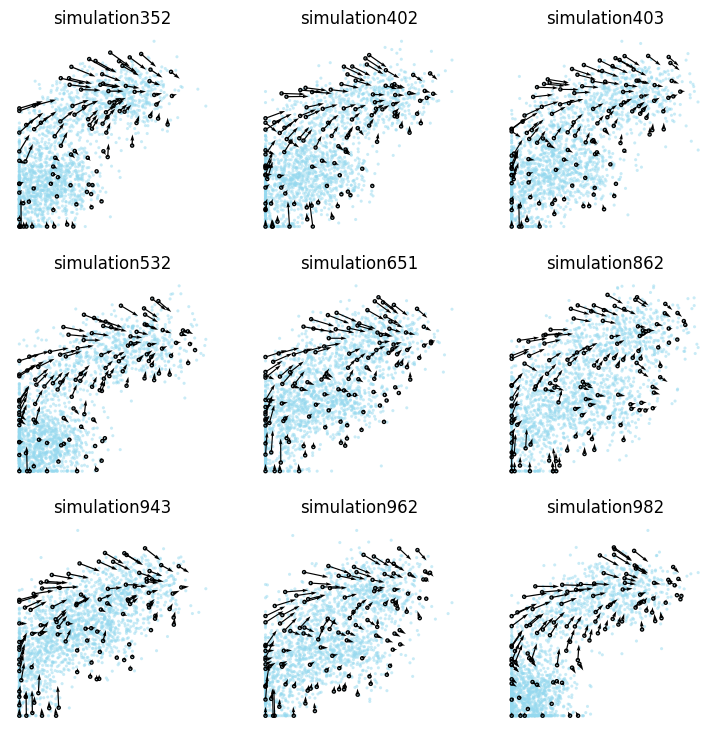

*************************************
Multi-backward_branching_7
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Multi-backward_branching_7to path :./1_simulation_datasets/Multi-backward_branching_7.csv


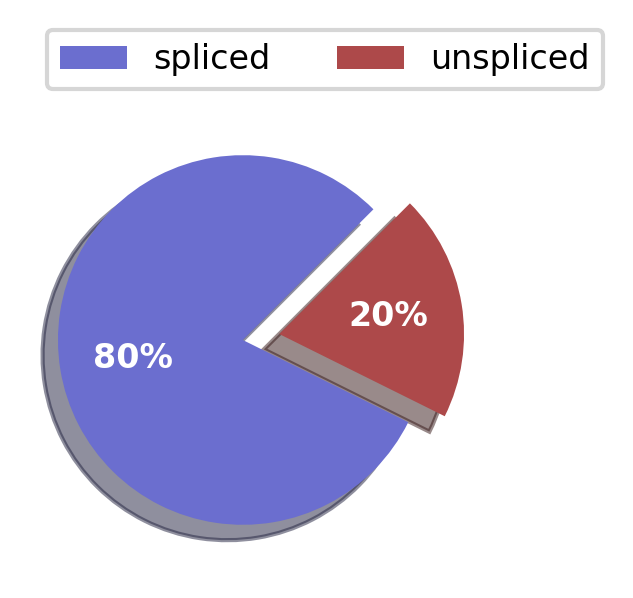

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Multi-backward_branching_7to path :./1_simulation_datasets/Multi-backward_branching_7.h5ad
['simulation038' 'simulation326' 'simulation414' 'simulation567'
 'simulation586' 'simulation681' 'simulation721' 'simulation757'
 'simulation906']
./2_Figure/Multi-backward_branching_7.groundtruth_gene_example.pdf


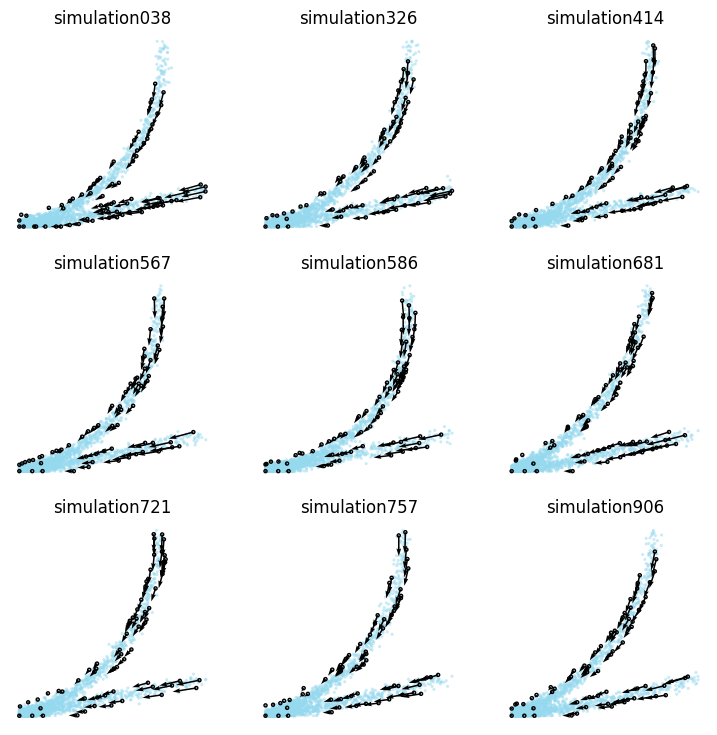

*************************************
Mono-kinetic_8
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Mono-kinetic_8to path :./1_simulation_datasets/Mono-kinetic_8.csv


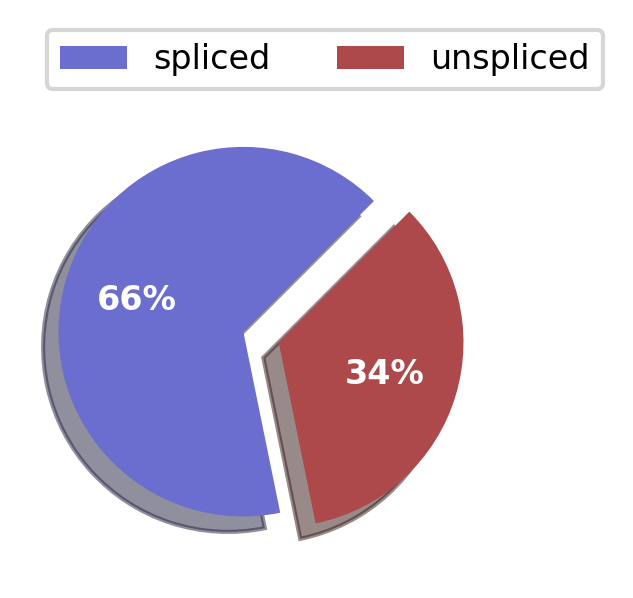

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Mono-kinetic_8to path :./1_simulation_datasets/Mono-kinetic_8.h5ad
['simulation352' 'simulation402' 'simulation403' 'simulation532'
 'simulation651' 'simulation862' 'simulation943' 'simulation962'
 'simulation982']
./2_Figure/Mono-kinetic_8.groundtruth_gene_example.pdf


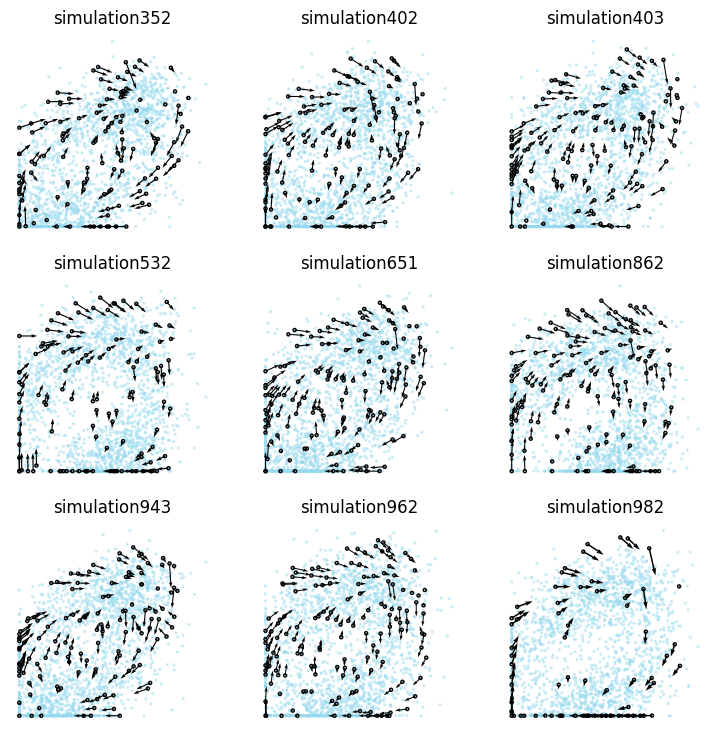

*************************************
Transcriptional_boost_8
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Transcriptional_boost_8to path :./1_simulation_datasets/Transcriptional_boost_8.csv


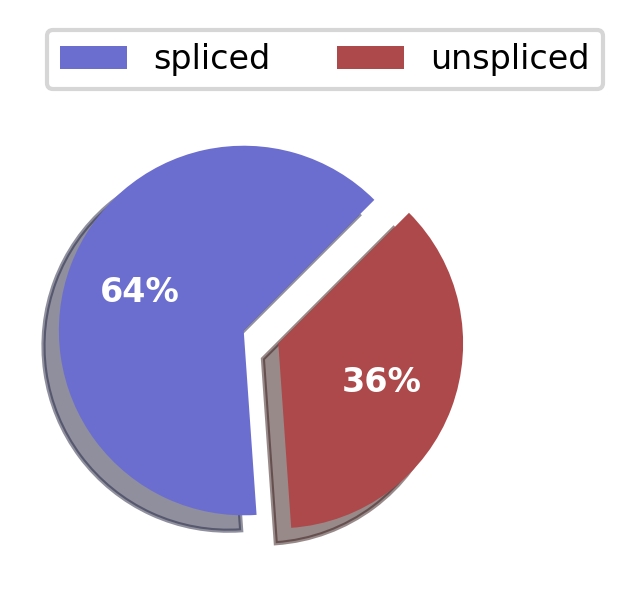

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Transcriptional_boost_8to path :./1_simulation_datasets/Transcriptional_boost_8.h5ad
['simulation352' 'simulation402' 'simulation403' 'simulation532'
 'simulation651' 'simulation862' 'simulation943' 'simulation962'
 'simulation982']
./2_Figure/Transcriptional_boost_8.groundtruth_gene_example.pdf


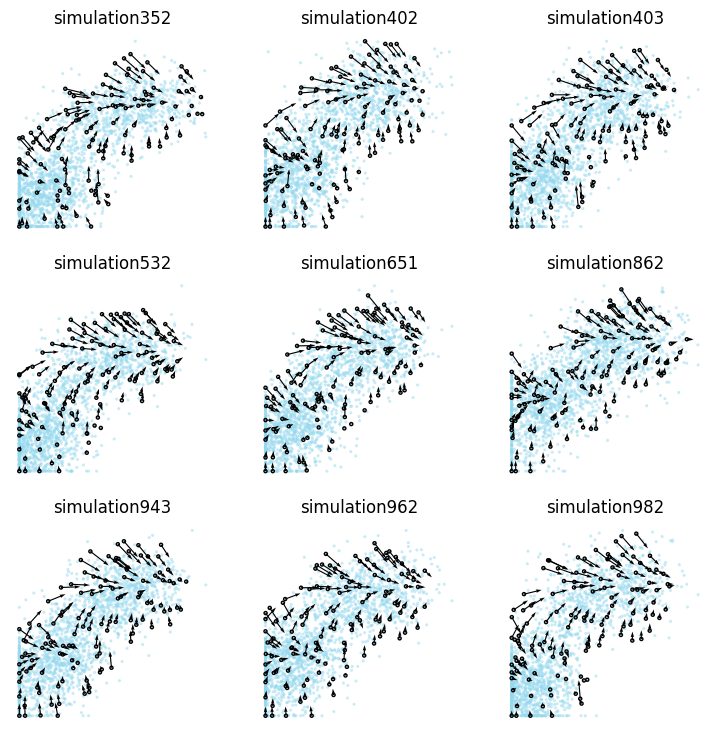

*************************************
Multi-forward_branching_8
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Multi-forward_branching_8to path :./1_simulation_datasets/Multi-forward_branching_8.csv


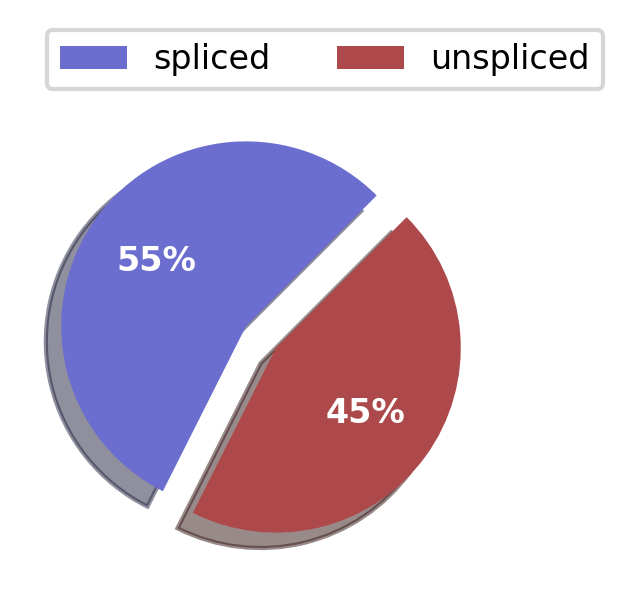

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Multi-forward_branching_8to path :./1_simulation_datasets/Multi-forward_branching_8.h5ad
['simulation352' 'simulation402' 'simulation403' 'simulation532'
 'simulation651' 'simulation862' 'simulation943' 'simulation962'
 'simulation982']
./2_Figure/Multi-forward_branching_8.groundtruth_gene_example.pdf


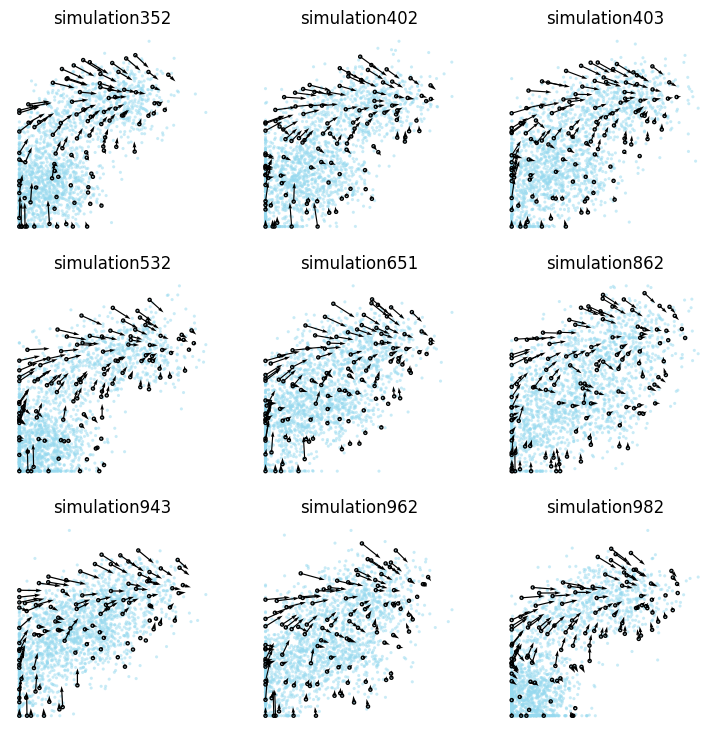

*************************************
Multi-backward_branching_8
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Multi-backward_branching_8to path :./1_simulation_datasets/Multi-backward_branching_8.csv


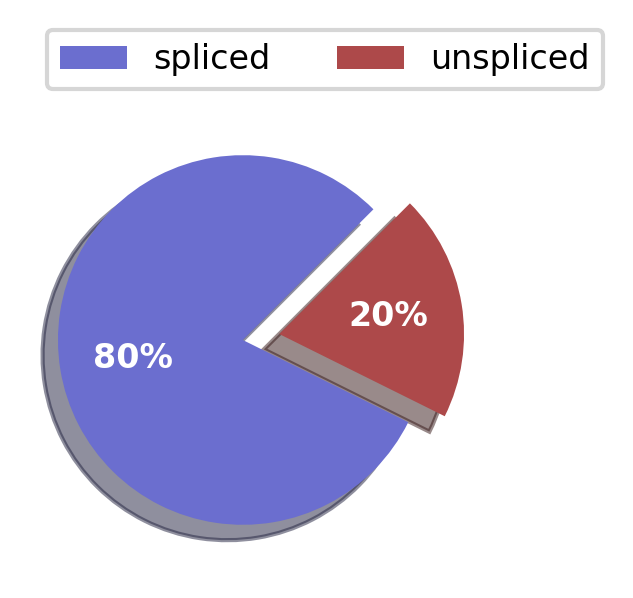

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Multi-backward_branching_8to path :./1_simulation_datasets/Multi-backward_branching_8.h5ad
['simulation038' 'simulation326' 'simulation414' 'simulation567'
 'simulation586' 'simulation681' 'simulation721' 'simulation757'
 'simulation906']
./2_Figure/Multi-backward_branching_8.groundtruth_gene_example.pdf


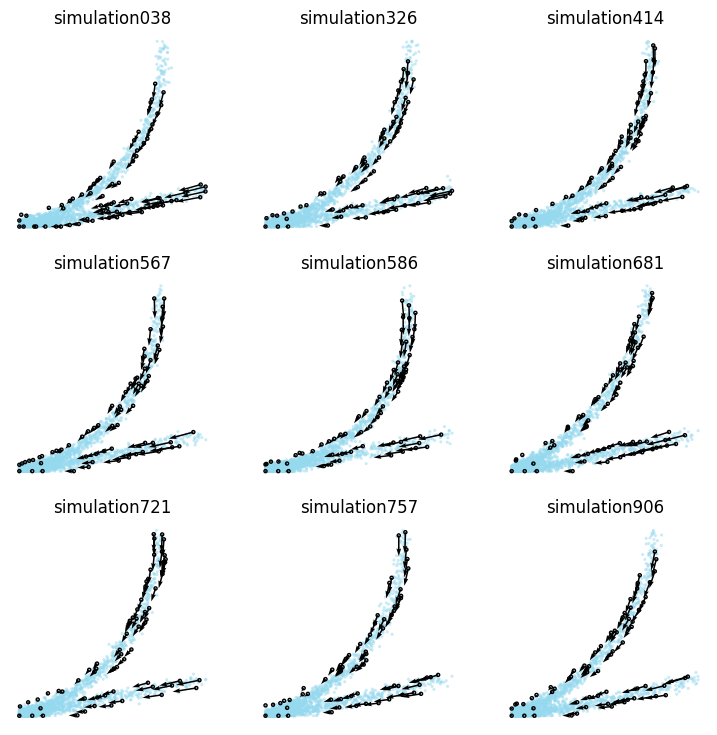

*************************************
Mono-kinetic_9
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Mono-kinetic_9to path :./1_simulation_datasets/Mono-kinetic_9.csv


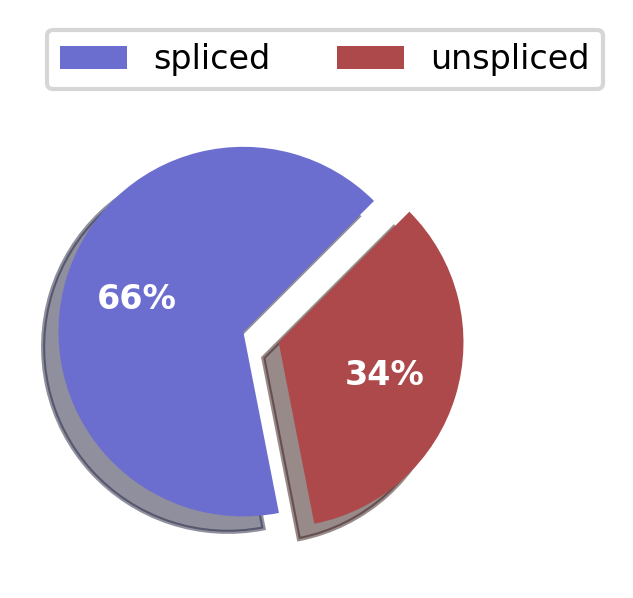

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Mono-kinetic_9to path :./1_simulation_datasets/Mono-kinetic_9.h5ad
['simulation352' 'simulation402' 'simulation403' 'simulation532'
 'simulation651' 'simulation862' 'simulation943' 'simulation962'
 'simulation982']
./2_Figure/Mono-kinetic_9.groundtruth_gene_example.pdf


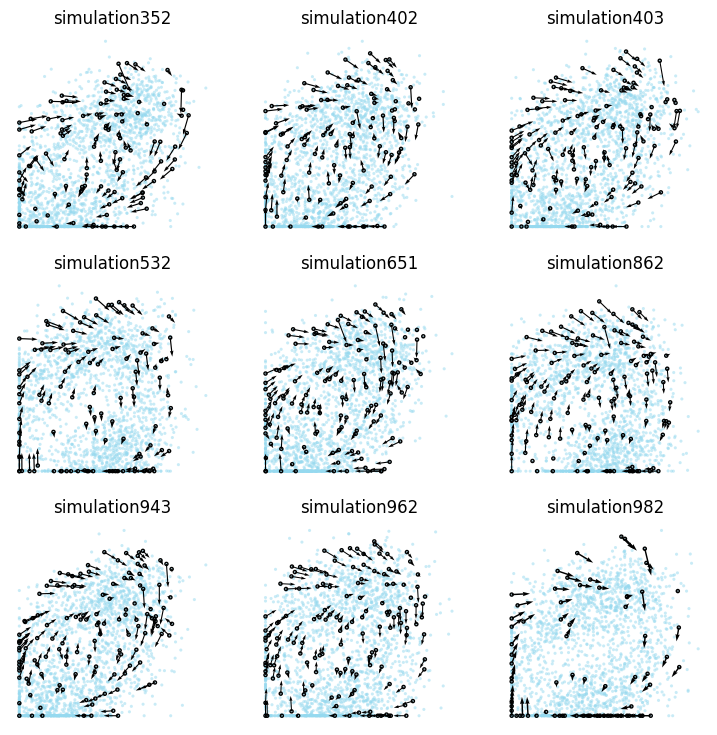

*************************************
Transcriptional_boost_9
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Transcriptional_boost_9to path :./1_simulation_datasets/Transcriptional_boost_9.csv


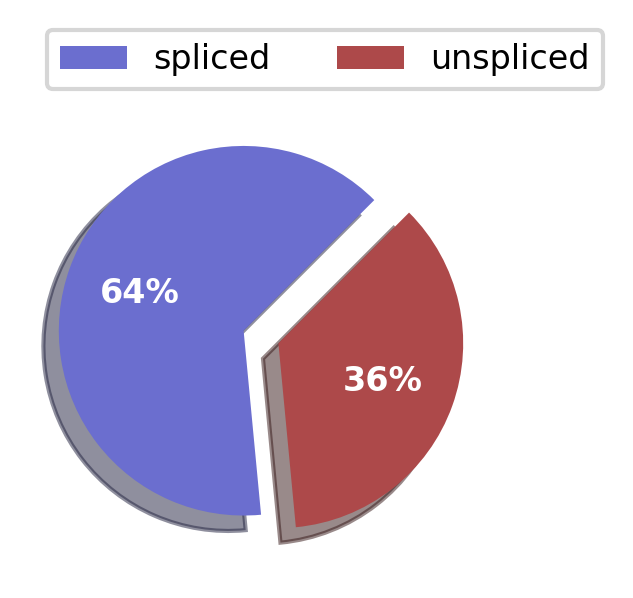

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Transcriptional_boost_9to path :./1_simulation_datasets/Transcriptional_boost_9.h5ad
['simulation352' 'simulation402' 'simulation403' 'simulation532'
 'simulation651' 'simulation862' 'simulation943' 'simulation962'
 'simulation982']
./2_Figure/Transcriptional_boost_9.groundtruth_gene_example.pdf


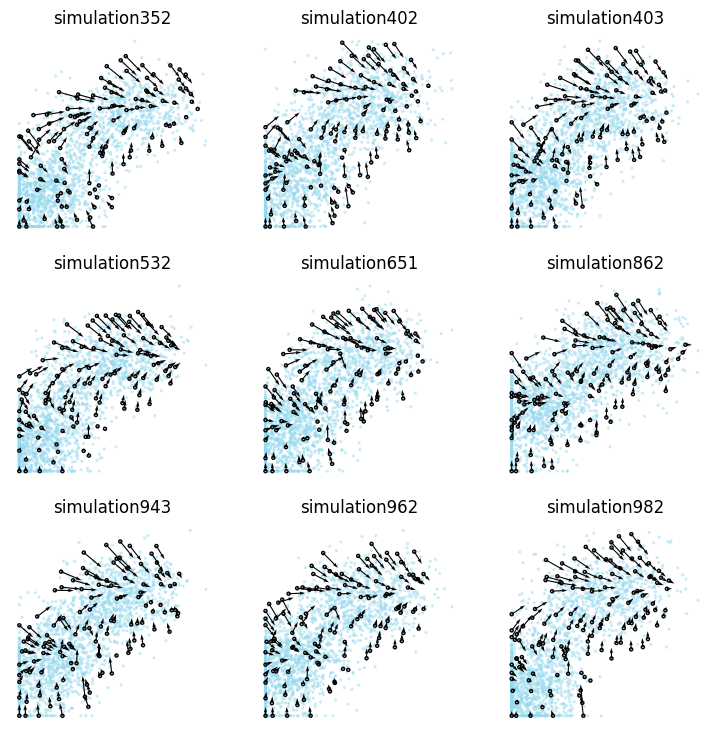

*************************************
Multi-forward_branching_9
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Multi-forward_branching_9to path :./1_simulation_datasets/Multi-forward_branching_9.csv


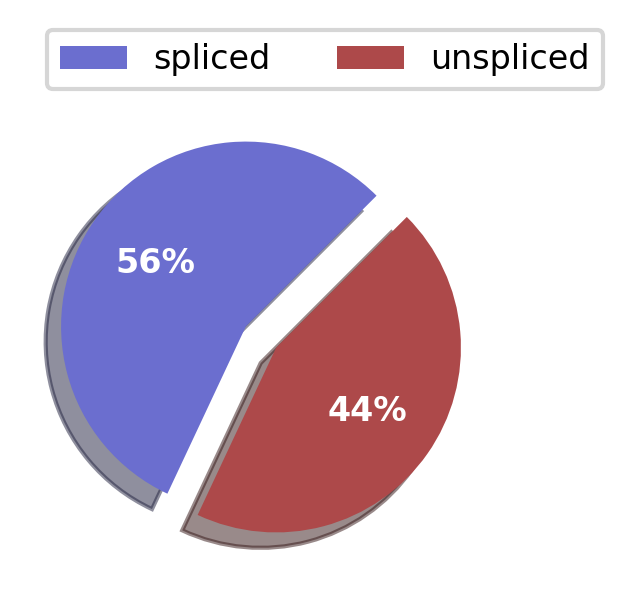

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Multi-forward_branching_9to path :./1_simulation_datasets/Multi-forward_branching_9.h5ad
['simulation352' 'simulation402' 'simulation403' 'simulation532'
 'simulation651' 'simulation862' 'simulation943' 'simulation962'
 'simulation982']
./2_Figure/Multi-forward_branching_9.groundtruth_gene_example.pdf


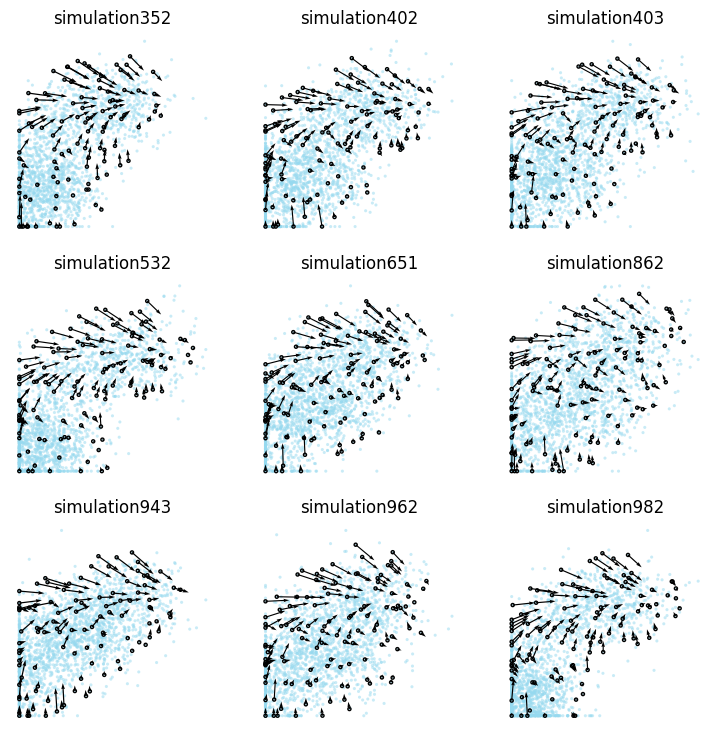

*************************************
Multi-backward_branching_9
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Multi-backward_branching_9to path :./1_simulation_datasets/Multi-backward_branching_9.csv


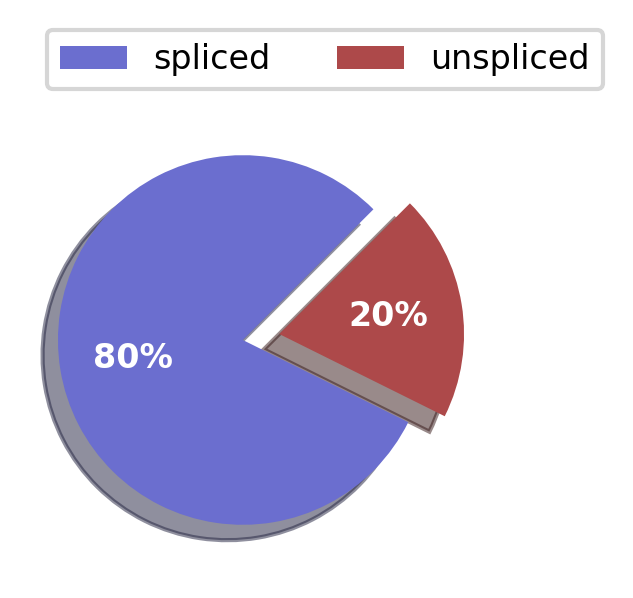

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Multi-backward_branching_9to path :./1_simulation_datasets/Multi-backward_branching_9.h5ad
['simulation038' 'simulation326' 'simulation414' 'simulation567'
 'simulation586' 'simulation681' 'simulation721' 'simulation757'
 'simulation906']
./2_Figure/Multi-backward_branching_9.groundtruth_gene_example.pdf


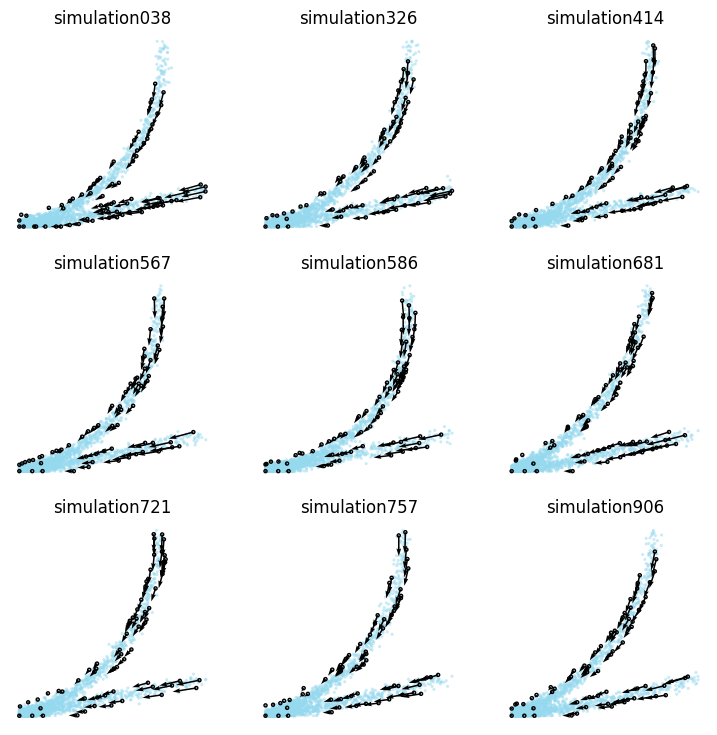

*************************************
Mono-kinetic_10
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Mono-kinetic_10to path :./1_simulation_datasets/Mono-kinetic_10.csv


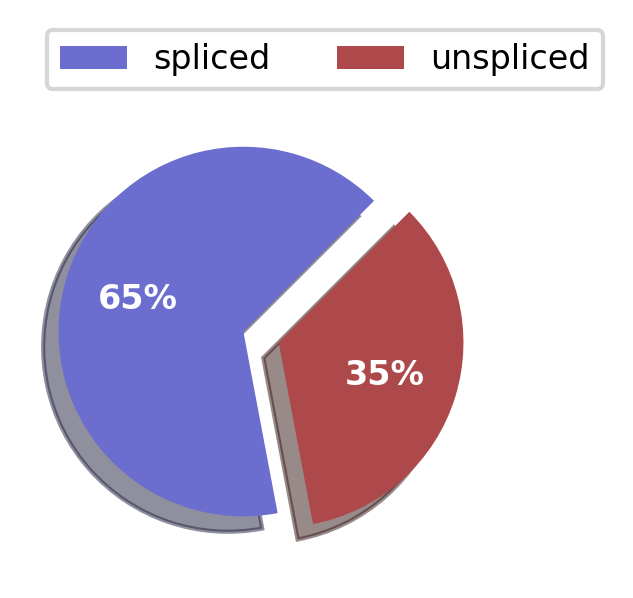

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Mono-kinetic_10to path :./1_simulation_datasets/Mono-kinetic_10.h5ad
['simulation352' 'simulation402' 'simulation403' 'simulation532'
 'simulation651' 'simulation862' 'simulation943' 'simulation962'
 'simulation982']
./2_Figure/Mono-kinetic_10.groundtruth_gene_example.pdf


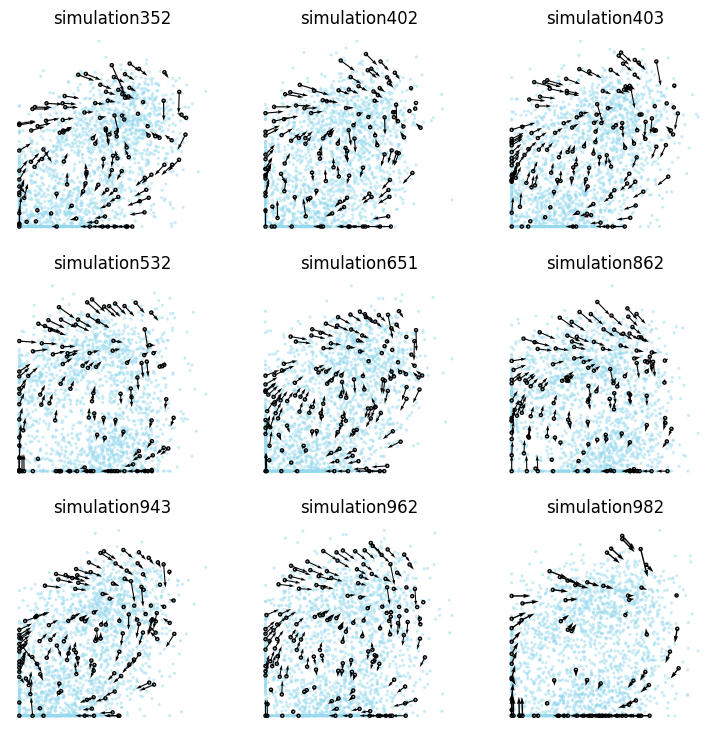

*************************************
Transcriptional_boost_10
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Transcriptional_boost_10to path :./1_simulation_datasets/Transcriptional_boost_10.csv


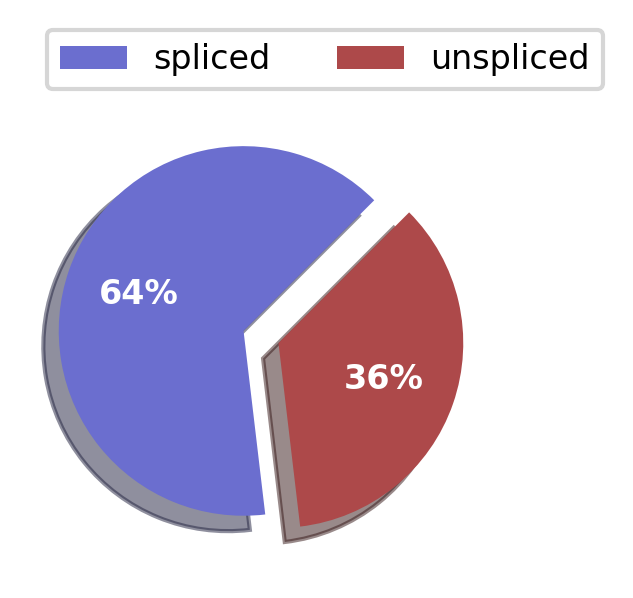

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Transcriptional_boost_10to path :./1_simulation_datasets/Transcriptional_boost_10.h5ad
['simulation352' 'simulation402' 'simulation403' 'simulation532'
 'simulation651' 'simulation862' 'simulation943' 'simulation962'
 'simulation982']
./2_Figure/Transcriptional_boost_10.groundtruth_gene_example.pdf


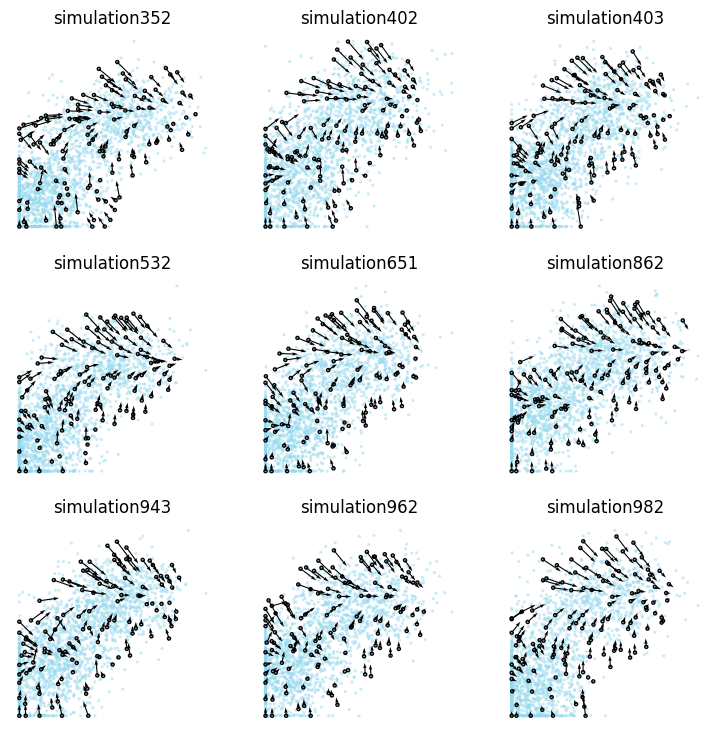

*************************************
Multi-forward_branching_10
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Multi-forward_branching_10to path :./1_simulation_datasets/Multi-forward_branching_10.csv


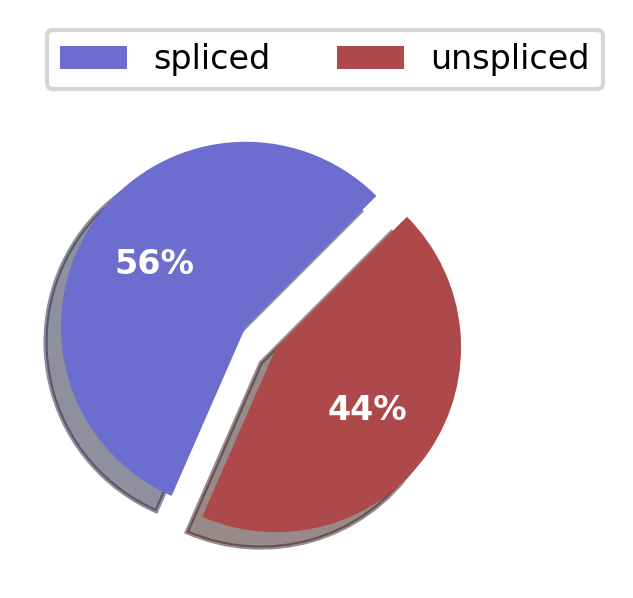

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Multi-forward_branching_10to path :./1_simulation_datasets/Multi-forward_branching_10.h5ad
['simulation352' 'simulation402' 'simulation403' 'simulation532'
 'simulation651' 'simulation862' 'simulation943' 'simulation962'
 'simulation982']
./2_Figure/Multi-forward_branching_10.groundtruth_gene_example.pdf


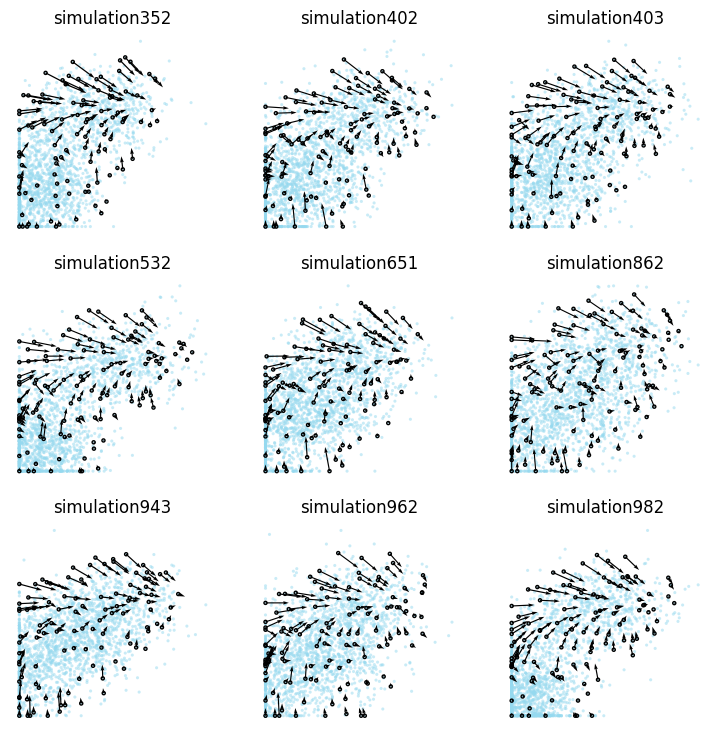

*************************************
Multi-backward_branching_10
Simulation gene : 0
Simulation gene : 100
Simulation gene : 200
Simulation gene : 300
Simulation gene : 400
Simulation gene : 500
Simulation gene : 600
Simulation gene : 700
Simulation gene : 800
Simulation gene : 900
Saving simulation dataframe : Multi-backward_branching_10to path :./1_simulation_datasets/Multi-backward_branching_10.csv


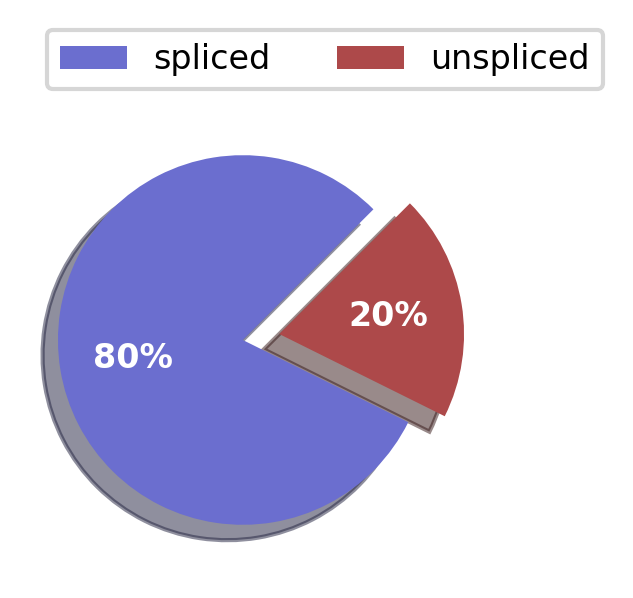

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Saving simulation h5ad : Multi-backward_branching_10to path :./1_simulation_datasets/Multi-backward_branching_10.h5ad
['simulation038' 'simulation326' 'simulation414' 'simulation567'
 'simulation586' 'simulation681' 'simulation721' 'simulation757'
 'simulation906']
./2_Figure/Multi-backward_branching_10.groundtruth_gene_example.pdf


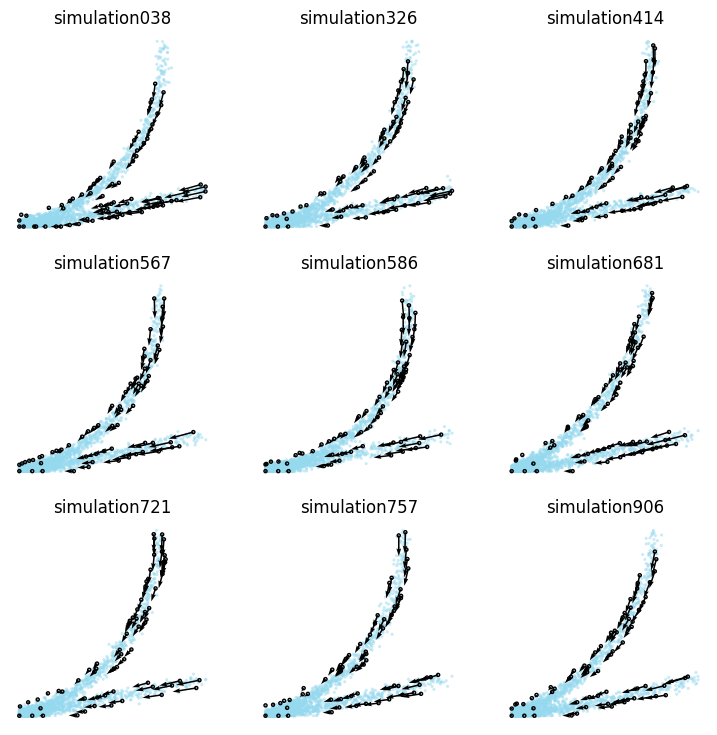

*************************************


In [4]:
for i in para.columns[1:]:
    print(i)
    Simulation_datasets(i)
    print("*************************************")